---
**Пример использования моделей для распознавания лиц, эмоций, пола и возраста в формате ONNX, написание на их основе веб-приложения на основе библиотеки Streamlit**

Данный ноутбук от репозитория  
https://github.com/sergey21000/face-detector-deepface

---

Сранение 5 популярных библиотек для детекции лиц  
https://habr.com/ru/articles/661671/  

Зоопарк моделей opencv (для детекции лиц в том числе)  
https://github.com/opencv/opencv_zoo/

# Обзор библиотеки DeepFace

Возможности DeepFace:   
- детектит координаты боксов для найденных лиц, координаты глаз, возраст, пол, эмоцию и расу (через метод `analyze()`)
- извлекает координаты лиц отдельно (метод `extract_faces()`)
- проверяет что на двух фото один и тот же человек (метод `verify()`)
- ищет лица конкретного человека в папке с фото (метод `find()`)
- возвращает эмбединги фото (метод `represent()`)


Страница библиотеки DeepFace  
https://github.com/serengil/deepface

Сранение моделей которые можно выбрать  
https://github.com/serengil/deepface/tree/master/benchmarks

## Установка библиотеки и импорты

Установка библиотеки DeepFace

In [ ]:
# установка библиотеки DeepFace
!pip install -q deepface

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 30.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 37.1 MB/s eta 0:00:00


In [ ]:
# версия библиотеки на момент запуска (октябрь 2024)
!pip list | grep deepface

deepface                           0.0.93


Установка директории куда будут загружаться веса моделей (опционально)  
По умолчанию веса загружаются в `/root/.deepface/weights`  

In [ ]:
# например установка папки models - она будет создана при импорте deepface
%env DEEPFACE_HOME=models

env: DEEPFACE_HOME=models


Место в коде где указывается папка загрузки моделей  
https://github.com/serengil/deepface/blob/master/deepface/commons/folder_utils.py#L34  

Веса скачиваются отсюда (можно скачать вручную)  
https://github.com/serengil/deepface_models/releases

Импорты

In [ ]:
from pathlib import Path

import cv2
import numpy as np

from PIL import Image, ImageDraw, ImageFont
from deepface import DeepFace

import matplotlib.pyplot as plt
plt.style.use('dark_background')

24-10-29 17:16:51 - Directory models/.deepface has been created
24-10-29 17:16:51 - Directory models/.deepface/weights has been created


## Загрузка примеров изображений

Загрузка датасета с лицами для демонстрации

In [ ]:
# загрузка датасета с лицами
!kaggle datasets download -d stoicstatic/face-recognition-dataset

Dataset URL: https://www.kaggle.com/datasets/stoicstatic/face-recognition-dataset
License(s): CC0-1.0
 93% 169M/181M [00:02<00:00, 62.7MB/s]
100% 181M/181M [00:02<00:00, 72.8MB/s]


In [ ]:
# распаковка архива датасета
!unzip -q face-recognition-dataset.zip

Загрузка изображений

In [ ]:
# название изображения
IMAGE_PATH = 'image.jpg'

# загрука изображения
if not Path(IMAGE_PATH).exists():
    !wget -qq -O "{IMAGE_PATH}" --show-progress http://dalma.news/wp-content/uploads/2018/09/residencia-profesional.jpg

# загрука изображения
IMAGE_PATH_1 = "emotions.jpg"
if not Path(IMAGE_PATH_1).exists():
    !wget -qq -O "{IMAGE_PATH_1}" --show-progress https://mykaleidoscope.ru/x/uploads/posts/2022-10/1666265946_37-mykaleidoscope-ru-p-motornie-komponenti-emotsii-krasivo-43.jpg

# загрука изображения
IMAGE_PATH_2 = "father.jpg"
if not Path(IMAGE_PATH_2).exists():
    !wget -qq -O "{IMAGE_PATH_2}" --show-progress https://files.speakerdeck.com/presentations/91b75a0a493b4fb698af79e6962cbd4e/slide_3.jpg

image.jpg           100%[===================>] 294.34K  1.08MB/s    in 0.3s    
emotions.jpg        100%[===================>] 234.74K   541KB/s    in 0.4s    
father.jpg          100%[===================>] 117.18K  --.-KB/s    in 0.02s   


Отрисовка изображения

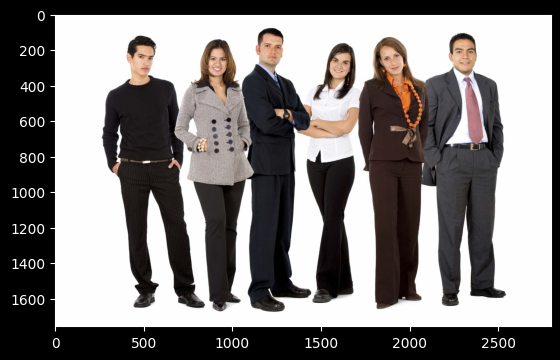

In [ ]:
pil_image = Image.open(IMAGE_PATH)
plt.imshow(pil_image)

## Детекция лиц, эмоций, пола, возраста и рассы

Инициализации модели распознавания и запуск распознавания с параметрами по умолчанию  
При первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше

In [ ]:
# # при первом запуске перед детекцией загружаются веса моделей распознавания
# result_dicts = DeepFace.analyze(
#     img_path=IMAGE_PATH,  # путь до картинки
#     actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
#     detector_backend='opencv',  #  детектор по умолчанию
#     align=True,  # дополнительное выравнивание перед детекцией, True или False
#     enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
#     anti_spoofing=True,  # определяет лицо настоящее или сгенерированное (на методе analyze не работает)
#     )

24-10-29 17:17:47 - Downloading MiniFASNetV2 weights to models/.deepface/weights/2.7_80x80_MiniFASNetV2.pth


Downloading...
From: https://github.com/minivision-ai/Silent-Face-Anti-Spoofing/raw/master/resources/anti_spoof_models/2.7_80x80_MiniFASNetV2.pth
To: /content/models/.deepface/weights/2.7_80x80_MiniFASNetV2.pth
100%|██████████| 1.85M/1.85M [00:00<00:00, 25.6MB/s]


24-10-29 17:17:48 - Downloading MiniFASNetV2 weights to models/.deepface/weights/4_0_0_80x80_MiniFASNetV1SE.pth


Downloading...
From: https://github.com/minivision-ai/Silent-Face-Anti-Spoofing/raw/master/resources/anti_spoof_models/4_0_0_80x80_MiniFASNetV1SE.pth
To: /content/models/.deepface/weights/4_0_0_80x80_MiniFASNetV1SE.pth
100%|██████████| 1.86M/1.86M [00:00<00:00, 24.4MB/s]
Action: age:   0%|          | 0/4 [00:00<?, ?it/s]    

24-10-29 17:17:56 - age_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/age_model_weights.h5
To: /content/models/.deepface/weights/age_model_weights.h5

  0%|          | 0.00/539M [00:00<?, ?B/s]
  1%|          | 3.15M/539M [00:00<00:17, 30.9MB/s]
  2%|▏         | 12.6M/539M [00:00<00:07, 67.8MB/s]
  5%|▍         | 25.7M/539M [00:00<00:05, 93.9MB/s]
  7%|▋         | 37.7M/539M [00:00<00:04, 102MB/s] 
 10%|█         | 54.0M/539M [00:00<00:03, 122MB/s]
 12%|█▏        | 67.1M/539M [00:00<00:03, 125MB/s]
 15%|█▍        | 79.7M/539M [00:00<00:03, 118MB/s]
 17%|█▋        | 91.8M/539M [00:00<00:03, 114MB/s]
 19%|█▉        | 103M/539M [00:00<00:03, 111MB/s] 
 21%|██▏       | 115M/539M [00:01<00:04, 104MB/s]
 23%|██▎       | 126M/539M [00:01<00:03, 104MB/s]
 25%|██▌       | 136M/539M [00:01<00:03, 104MB/s]
 28%|██▊       | 149M/539M [00:01<00:03, 109MB/s]
 30%|███       | 163M/539M [00:01<00:03, 118MB/s]
 33%|███▎      | 177M/539M [00:01<00:02, 123MB/s]
 36%|███▌      | 192M/539

24-10-29 17:18:05 - gender_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/gender_model_weights.h5
To: /content/models/.deepface/weights/gender_model_weights.h5

  0%|          | 0.00/537M [00:00<?, ?B/s]
  3%|▎         | 13.6M/537M [00:00<00:03, 136MB/s]
  9%|▊         | 46.1M/537M [00:00<00:01, 247MB/s]
 14%|█▍        | 73.9M/537M [00:00<00:01, 259MB/s]
 19%|█▉        | 102M/537M [00:00<00:01, 268MB/s] 
 24%|██▍       | 129M/537M [00:00<00:01, 245MB/s]
 29%|██▉       | 155M/537M [00:00<00:01, 246MB/s]
 34%|███▍      | 181M/537M [00:00<00:01, 252MB/s]
 39%|███▊      | 207M/537M [00:00<00:01, 249MB/s]
 44%|████▍     | 236M/537M [00:00<00:01, 261MB/s]
 49%|████▉     | 263M/537M [00:01<00:01, 259MB/s]
 54%|█████▍    | 289M/537M [00:01<00:01, 239MB/s]
 58%|█████▊    | 314M/537M [00:01<00:00, 238MB/s]
 64%|██████▎   | 341M/537M [00:01<00:00, 248MB/s]
 68%|██████▊   | 366M/537M [00:05<00:08, 19.6MB/s]
 72%|███████▏  | 387M/537M [00:05<00:05, 25.3MB/s]
 77%|███████▋  | 412M/537M

24-10-29 17:18:16 - race_model_single_batch.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/race_model_single_batch.h5
To: /content/models/.deepface/weights/race_model_single_batch.h5

  0%|          | 0.00/537M [00:00<?, ?B/s]
  1%|▏         | 7.34M/537M [00:00<00:07, 72.9MB/s]
  7%|▋         | 37.7M/537M [00:00<00:02, 208MB/s] 
 13%|█▎        | 68.2M/537M [00:00<00:01, 251MB/s]
 17%|█▋        | 93.3M/537M [00:00<00:01, 238MB/s]
 22%|██▏       | 118M/537M [00:00<00:01, 242MB/s] 
 27%|██▋       | 143M/537M [00:00<00:01, 234MB/s]
 31%|███       | 168M/537M [00:00<00:01, 237MB/s]
 36%|███▌      | 192M/537M [00:00<00:01, 240MB/s]
 41%|████      | 221M/537M [00:00<00:01, 252MB/s]
 46%|████▌     | 246M/537M [00:01<00:01, 251MB/s]
 51%|█████     | 272M/537M [00:01<00:01, 250MB/s]
 55%|█████▌    | 297M/537M [00:01<00:00, 243MB/s]
 60%|█████▉    | 322M/537M [00:01<00:00, 243MB/s]
 65%|██████▍   | 348M/537M [00:01<00:00, 246MB/s]
 69%|██████▉   | 373M/537M [00:01<00:00, 249MB/s]
 74%|███████▍  | 39

24-10-29 17:18:21 - facial_expression_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facial_expression_model_weights.h5
To: /content/models/.deepface/weights/facial_expression_model_weights.h5

100%|██████████| 5.98M/5.98M [00:00<00:00, 69.1MB/s]
Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]


Запуск распознавания с измерением скорости

In [ ]:
%%time

result_dicts = DeepFace.analyze(
    img_path=IMAGE_PATH,  # путь до картинки
    actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
    detector_backend='opencv',  #  детектор по умолчанию
    align=True,  # дополнительное выравнивание перед детекцией, True или False
    enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
    )

Action: emotion: 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

CPU times: user 40.7 s, sys: 1.88 s, total: 42.6 s
Wall time: 32.6 s


Проверка с параметром `align=False` (быстрее)

In [ ]:
%%time

result_dicts = DeepFace.analyze(
    img_path=IMAGE_PATH,  # путь до картинки
    actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
    detector_backend='opencv',  #  детектор по умолчанию
    align=False,  # дополнительное выравнивание перед детекцией, True или False
    enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
    )

Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.42it/s]

CPU times: user 26.3 s, sys: 228 ms, total: 26.5 s
Wall time: 17.8 s


Список словарей с результатами детекции для каждого найденного лица

In [ ]:
result_dicts

[{'age': 24,
  'region': {'x': 851,
   'y': 204,
   'w': 135,
   'h': 135,
   'left_eye': (944, 256),
   'right_eye': (893, 255)},
  'face_confidence': 0.89,
  'gender': {'Woman': 99.99426603317261, 'Man': 0.005730993507313542},
  'dominant_gender': 'Woman',
  'race': {'asian': 25.527611437751226,
   'indian': 7.227768865557774,
   'black': 3.2723836776475523,
   'white': 20.396488356171652,
   'middle eastern': 6.060805521703425,
   'latino hispanic': 37.51494437634282},
  'dominant_race': 'latino hispanic',
  'emotion': {'angry': 4.938853839786539e-09,
   'disgust': 7.673585487616747e-17,
   'fear': 1.2518558780739986e-11,
   'happy': 91.92751049995422,
   'sad': 1.5394544305991076e-06,
   'surprise': 1.0593172561357278e-05,
   'neutral': 8.072477579116821},
  'dominant_emotion': 'happy'},
 {'age': 24,
  'region': {'x': 1147,
   'y': 124,
   'w': 162,
   'h': 162,
   'left_eye': (1258, 190),
   'right_eye': (1196, 181)},
  'face_confidence': 0.92,
  'gender': {'Woman': 0.000417546743

In [ ]:
# словарь для первого лица
result_dicts[0]

{'age': 24,
 'region': {'x': 851,
  'y': 204,
  'w': 135,
  'h': 135,
  'left_eye': (944, 256),
  'right_eye': (893, 255)},
 'face_confidence': 0.89,
 'gender': {'Woman': 99.99426603317261, 'Man': 0.005730993507313542},
 'dominant_gender': 'Woman',
 'race': {'asian': 25.527611437751226,
  'indian': 7.227768865557774,
  'black': 3.2723836776475523,
  'white': 20.396488356171652,
  'middle eastern': 6.060805521703425,
  'latino hispanic': 37.51494437634282},
 'dominant_race': 'latino hispanic',
 'emotion': {'angry': 4.938853839786539e-09,
  'disgust': 7.673585487616747e-17,
  'fear': 1.2518558780739986e-11,
  'happy': 91.92751049995422,
  'sad': 1.5394544305991076e-06,
  'surprise': 1.0593172561357278e-05,
  'neutral': 8.072477579116821},
 'dominant_emotion': 'happy'}

In [ ]:
# параметры метода и что он возвращает
print(DeepFace.analyze.__doc__)


    Analyze facial attributes such as age, gender, emotion, and race in the provided image.
    Args:
        img_path (str or np.ndarray): The exact path to the image, a numpy array in BGR format,
            or a base64 encoded image. If the source image contains multiple faces, the result will
            include information for each detected face.

        actions (tuple): Attributes to analyze. The default is ('age', 'gender', 'emotion', 'race').
            You can exclude some of these attributes from the analysis if needed.

        enforce_detection (boolean): If no face is detected in an image, raise an exception.
            Set to False to avoid the exception for low-resolution images (default is True).

        detector_backend (string): face detector backend. Options: 'opencv', 'retinaface',
            'mtcnn', 'ssd', 'dlib', 'mediapipe', 'yolov8', 'centerface' or 'skip'
            (default is opencv).

        distance_metric (string): Metric for measuring similarity.

Отрисовка результатов детекции

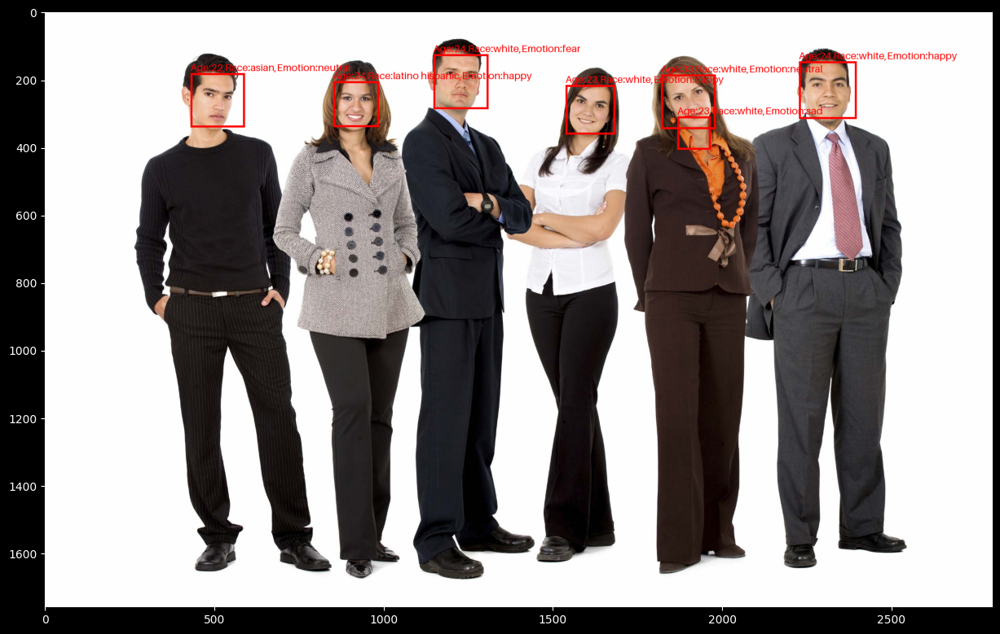

In [ ]:
# открыть картинку и создать объект для рисования
pil_image = Image.open(IMAGE_PATH)
draw = ImageDraw.Draw(pil_image)

# настройки отрисовки
color = 'red'
font_size = 30
font = ImageFont.load_default(size=font_size)

# итерация по словарям для каждого лица
for res_dict in result_dicts:
    # извлечение артибутов
    gender = res_dict['dominant_gender']
    age = res_dict['age']
    x, y, w, h, left_eye, right_eye = res_dict['region'].values()
    race = res_dict['dominant_race']
    emotion = res_dict['dominant_emotion']
    text = f'Age:{age},Race:{race},Emotion:{emotion}'

    # отрисовка боксов и надписей
    draw.rectangle((x, y, x + w, y + h), outline=color, width=6)
    draw.text(xy=(x, y), text=text, font=font, fill=color, anchor="lb")

plt.figure(figsize=(15, 12))
plt.imshow(pil_image)
plt.show()

Отрисовка результатов детекции с заливкой

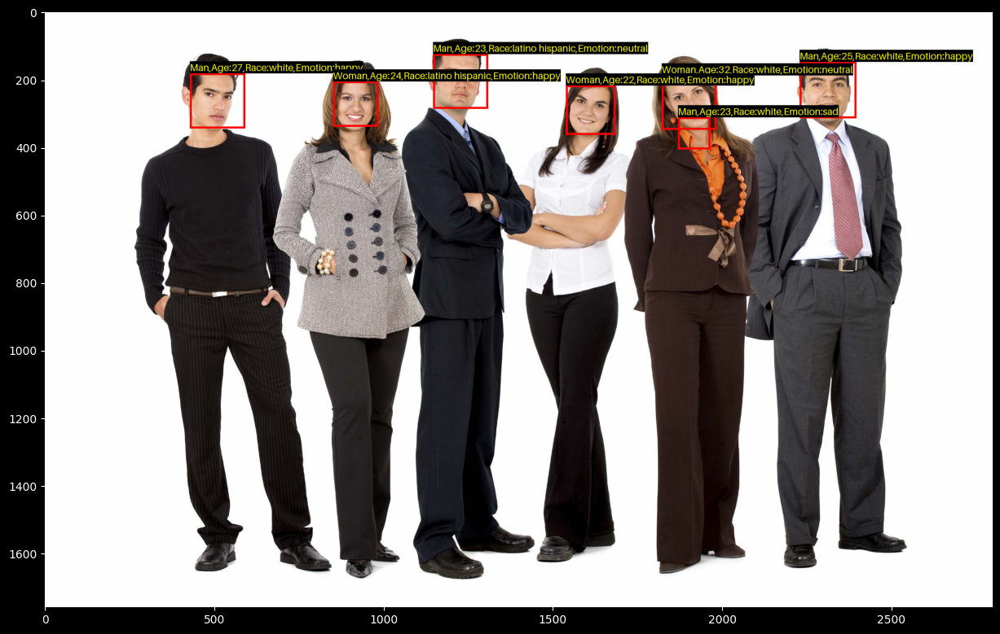

In [ ]:
# открыть картинку и создать объект для рисования
pil_image = Image.open(IMAGE_PATH)
draw = ImageDraw.Draw(pil_image)

# настройки отрисовки
box_color = 'red'  # цвет бокса
text_color = 'yellow'  # цвет текста
fill_color = 'black'  # цвет заливки текста

# размер шрифта текста (в 60 раз меньше чем высота картинки)
font_size = pil_image.size[1] // 60
# инициализация шрифта
font = ImageFont.load_default(size=font_size)

# итерация по словарям для каждого лица
for res_dict in result_dicts:
    # извлечение артибутов
    gender = res_dict['dominant_gender']
    age = res_dict['age']
    # левый верхний угол и ширина с высотой бокса
    x, y, w, h, left_eye, right_eye = res_dict['region'].values()
    race = res_dict['dominant_race']
    emotion = res_dict['dominant_emotion']
    # текст который нужно подписать
    text = f'{gender},Age:{age},Race:{race},Emotion:{emotion}'
    # отрисовка боксов и надписей
    draw.rectangle((x, y, x + w, y + h), outline=box_color, width=6)
    # получение итоговой длины и высоты теста чтобы написать его на закрашенном прямоугольнике
    _, _, text_width, text_height = font.getbbox(text)
    # если ширина текста выходит за экран вправо то двигаем текст левее
    if (x + text_width) > pil_image.size[0]:
        x -= text_width / 2
    # отрисовка и заливка сплошным цветом прямоугольника, на котором будет текст
    draw.rectangle(xy=(x, y - text_height, x + text_width, y), fill=fill_color)
    draw.text(xy=(x, y), text=text, font=font, fill=text_color, anchor="lb")

# отрисовка
plt.figure(figsize=(15, 12))
plt.imshow(pil_image)
plt.show()

Отрисовка результатов детекции в отдельном окне

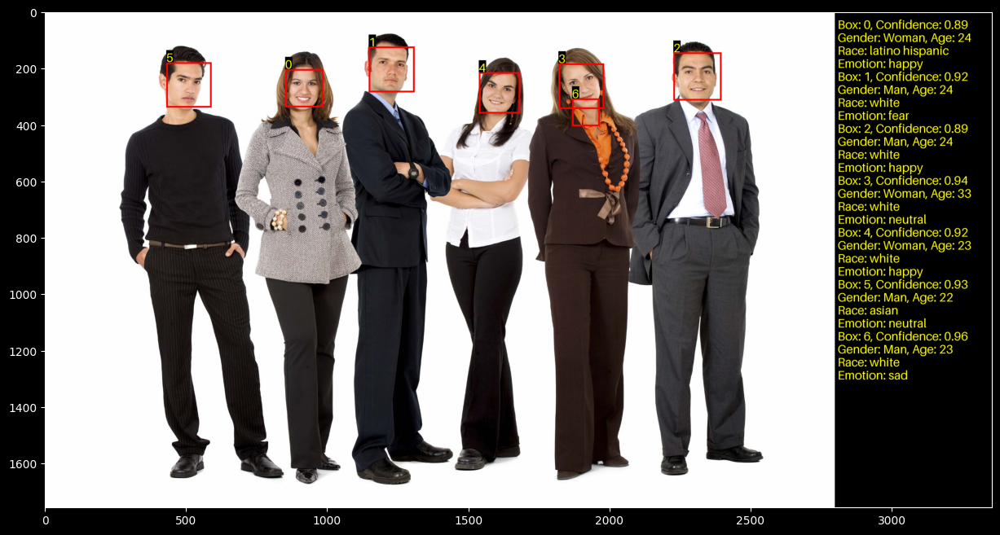

In [ ]:
# чтение исходной картинки (заменить путь IMAGE_PATH на свой)
pil_image1 = Image.open(IMAGE_PATH)
draw1 = ImageDraw.Draw(pil_image1)
# ширина и высота исходной картинки
w1, h1 = pil_image1.size

# настройки отрисовки
box_color = 'red'  # цвет бокса
text_color = 'yellow'  # цвет текста
fill_color = 'black'  # цвет заливки текста
font_size = h1 // 40  # размер шрифта текста (в 40 раз меньше чем высота картинки)
font = ImageFont.load_default(size=font_size)  # инициализация шрифта

# текст с результатами детекции со всеми лицами
full_text = ''
# итерация по словарям для каждого лица
for i, res_dict in enumerate(result_dicts):
    # извлечение артибутов
    gender = res_dict['dominant_gender']
    age = res_dict['age']
    confidence = res_dict['face_confidence']
    # левый верхний угол и ширина с высотой бокса
    x, y, w, h, left_eye, right_eye = res_dict['region'].values()
    race = res_dict['dominant_race']
    emotion = res_dict['dominant_emotion']
    # текст который нужно подписать для текущего лица
    text = f'Gender: {gender}, Age: {age}\nRace: {race}\nEmotion: {emotion}'
    # итоговый текст для всех лиц
    full_text += f'Box: {i}, Confidence: {confidence}\n{text}\n'

    # отрисовка боксов для каждого лица
    draw1.rectangle((x, y, x + w, y + h), outline=box_color, width=6)
    # заливка цветом номера лица
    _, _, text_width, text_height = font.getbbox(str(i))
    draw1.rectangle(xy=(x, y - text_height, x + text_width, y), fill=fill_color)
    # подпись номера лица
    draw1.text(xy=(x, y), text=str(i), font=font, fill=text_color, anchor="lb")

# создание второй картинки для отрисовки текста с результатами детекции для каждого лица
# ширина и выстота картиинки с результатами (например ширина в 5 раз меньше чем исходная)
w2 = w1 // 5
h2 = h1
# создание второй картинки
pil_image2 = Image.new('RGB', (w2, h2), fill_color)
draw2 = ImageDraw.Draw(pil_image2)
# нанесение текста на вторую картинку
draw2.text(xy=(10, 20), text=full_text, font=font, fill=text_color)

# соединение первой и второй картинки
fill_img = Image.new('RGB', (w1 + w2, h1), fill_color)
fill_img.paste(pil_image1, (0, 0))
fill_img.paste(pil_image2, (w1, 0))

# отрисовка результата
plt.figure(figsize=(15, 10))
plt.imshow(fill_img)
plt.show()

## Смена моделей

Детекция лиц, эмоций, пола, возраста и рассы с другой моделью

In [ ]:
# какие бэкенды можно выбрать (для установки некоторых требуется установка соотвествующих библиотек)
backends = ['opencv', 'ssd', 'dlib', 'mtcnn', 'fastmtcnn', 'retinaface', 'mediapipe', 'yolov8', 'yunet', 'centerface']

In [ ]:
%%time

# при первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше
result_dicts = DeepFace.analyze(
    img_path=IMAGE_PATH,  # путь до картинки
    actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
    detector_backend='yunet',  # поставить другой бэкенд (вроде бы yunet самый быстрый)
    align=False,  # с алгоритмом yunet нужно установить False иначе находит только одно лицо
    enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
    )

Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.34it/s]

CPU times: user 21 s, sys: 67.7 ms, total: 21 s
Wall time: 13.8 s


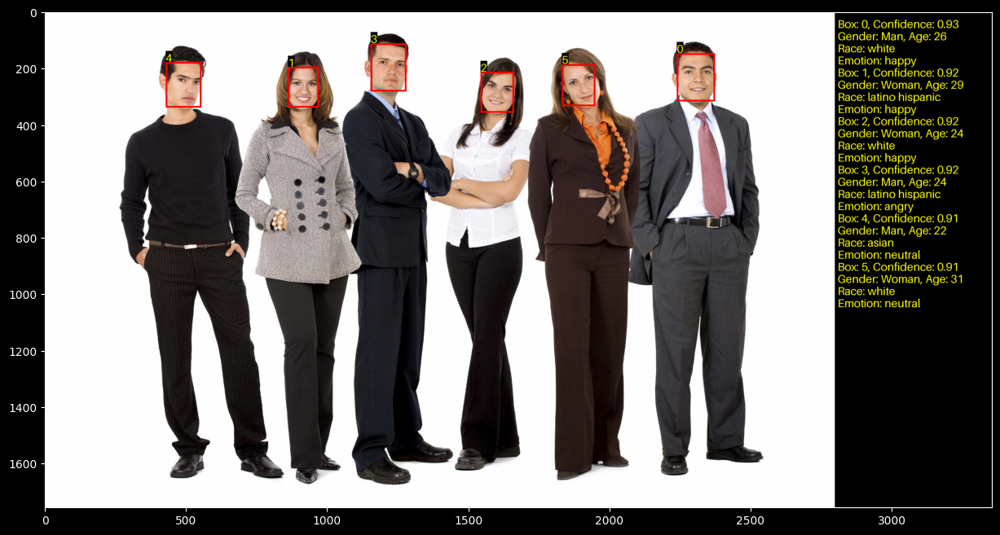

In [ ]:
# чтение исходной картинки (заменить путь IMAGE_PATH на свой)
pil_image1 = Image.open(IMAGE_PATH)
draw1 = ImageDraw.Draw(pil_image1)
# ширина и высота исходной картинки
w1, h1 = pil_image1.size

# настройки отрисовки
box_color = 'red'  # цвет бокса
text_color = 'yellow'  # цвет текста
fill_color = 'black'  # цвет заливки текста
font_size = h1 // 40  # размер шрифта текста (в 40 раз меньше чем высота картинки)
font = ImageFont.load_default(size=font_size)  # инициализация шрифта

# текст с результатами детекции со всеми лицами
full_text = ''
# итерация по словарям для каждого лица
for i, res_dict in enumerate(result_dicts):
    # извлечение артибутов
    gender = res_dict['dominant_gender']
    age = res_dict['age']
    confidence = res_dict['face_confidence']
    # левый верхний угол и ширина с высотой бокса
    x, y, w, h, left_eye, right_eye = res_dict['region'].values()
    race = res_dict['dominant_race']
    emotion = res_dict['dominant_emotion']
    # текст который нужно подписать для текущего лица
    text = f'Gender: {gender}, Age: {age}\nRace: {race}\nEmotion: {emotion}'
    # итоговый текст для всех лиц
    full_text += f'Box: {i}, Confidence: {confidence}\n{text}\n'

    # отрисовка боксов для каждого лица
    draw1.rectangle((x, y, x + w, y + h), outline=box_color, width=6)
    # заливка цветом номера лица
    _, _, text_width, text_height = font.getbbox(str(i))
    draw1.rectangle(xy=(x, y - text_height, x + text_width, y), fill=fill_color)
    # подпись номера лица
    draw1.text(xy=(x, y), text=str(i), font=font, fill=text_color, anchor="lb")

# создание второй картинки для отрисовки текста с результатами детекции для каждого лица
# ширина и выстота картиинки с результатами (например ширина в 5 раз меньше чем исходная)
w2 = w1 // 5
h2 = h1
# создание второй картинки
pil_image2 = Image.new('RGB', (w2, h2), fill_color)
draw2 = ImageDraw.Draw(pil_image2)
# нанесение текста на вторую картинку
draw2.text(xy=(10, 20), text=full_text, font=font, fill=text_color)

# соединение первой и второй картинки
fill_img = Image.new('RGB', (w1 + w2, h1), fill_color)
fill_img.paste(pil_image1, (0, 0))
fill_img.paste(pil_image2, (w1, 0))

# отрисовка результата
plt.figure(figsize=(15, 10))
plt.imshow(fill_img)
plt.show()

Проверка скорости на GPU

In [ ]:
%%time

# при первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше
result_dicts = DeepFace.analyze(
    img_path=IMAGE_PATH,  # путь до картинки
    actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
    detector_backend='yunet',  # поставить другой бэкенд (вроде бы yunet самый быстрый)
    align=False,  # с алгоритмом yunet нужно установить False иначе находит только одно лицо
    enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
    )

Action: emotion: 100%|██████████| 4/4 [00:00<00:00, 44.24it/s]

CPU times: user 628 ms, sys: 22 ms, total: 650 ms
Wall time: 651 ms


Другая модель

In [ ]:
%%time

# при первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше
result_dicts = DeepFace.analyze(
    img_path=IMAGE_PATH,  # путь до картинки
    actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
    detector_backend='centerface',  # поставить другой бэкенд
    align=False,  # с алгоритмом yunet нужно установить False иначе находит только одно лицо
    enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
    )

Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

CPU times: user 25.9 s, sys: 2.68 s, total: 28.6 s
Wall time: 23.3 s


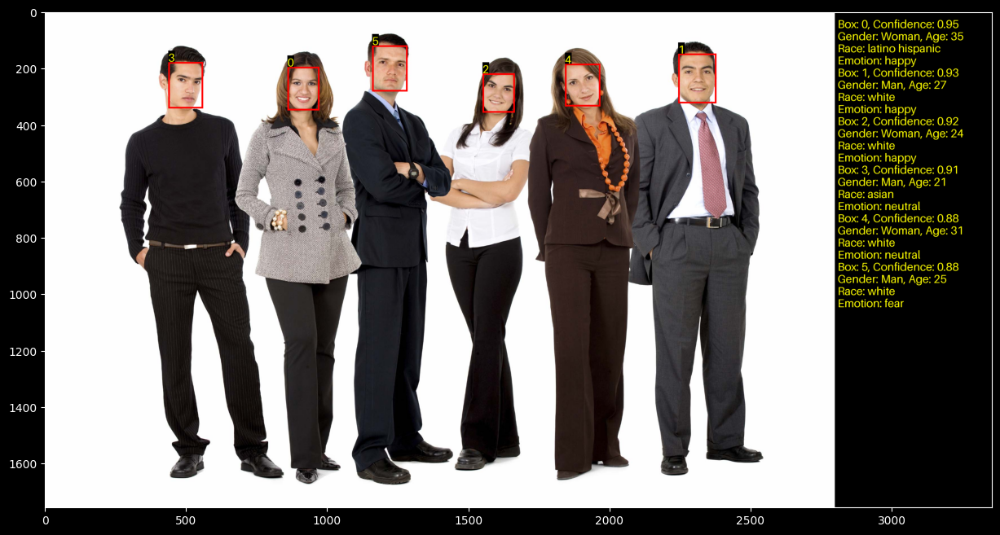

In [ ]:
# чтение исходной картинки (заменить путь IMAGE_PATH на свой)
pil_image1 = Image.open(IMAGE_PATH)
draw1 = ImageDraw.Draw(pil_image1)
# ширина и высота исходной картинки
w1, h1 = pil_image1.size

# настройки отрисовки
box_color = 'red'  # цвет бокса
text_color = 'yellow'  # цвет текста
fill_color = 'black'  # цвет заливки текста
font_size = h1 // 40  # размер шрифта текста (в 40 раз меньше чем высота картинки)
font = ImageFont.load_default(size=font_size)  # инициализация шрифта

# текст с результатами детекции со всеми лицами
full_text = ''
# итерация по словарям для каждого лица
for i, res_dict in enumerate(result_dicts):
    # извлечение артибутов
    gender = res_dict['dominant_gender']
    age = res_dict['age']
    confidence = res_dict['face_confidence']
    # левый верхний угол и ширина с высотой бокса
    x, y, w, h, left_eye, right_eye = res_dict['region'].values()
    race = res_dict['dominant_race']
    emotion = res_dict['dominant_emotion']
    # текст который нужно подписать для текущего лица
    text = f'Gender: {gender}, Age: {age}\nRace: {race}\nEmotion: {emotion}'
    # итоговый текст для всех лиц
    full_text += f'Box: {i}, Confidence: {confidence}\n{text}\n'

    # отрисовка боксов для каждого лица
    draw1.rectangle((x, y, x + w, y + h), outline=box_color, width=6)
    # заливка цветом номера лица
    _, _, text_width, text_height = font.getbbox(str(i))
    draw1.rectangle(xy=(x, y - text_height, x + text_width, y), fill=fill_color)
    # подпись номера лица
    draw1.text(xy=(x, y), text=str(i), font=font, fill=text_color, anchor="lb")

# создание второй картинки для отрисовки текста с результатами детекции для каждого лица
# ширина и выстота картиинки с результатами (например ширина в 5 раз меньше чем исходная)
w2 = w1 // 5
h2 = h1
# создание второй картинки
pil_image2 = Image.new('RGB', (w2, h2), fill_color)
draw2 = ImageDraw.Draw(pil_image2)
# нанесение текста на вторую картинку
draw2.text(xy=(10, 20), text=full_text, font=font, fill=text_color)

# соединение первой и второй картинки
fill_img = Image.new('RGB', (w1 + w2, h1), fill_color)
fill_img.paste(pil_image1, (0, 0))
fill_img.paste(pil_image2, (w1, 0))

# отрисовка результата
plt.figure(figsize=(15, 10))
plt.imshow(fill_img)
plt.show()

Бэкенд YOLO

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 876.6/876.6 kB 21.7 MB/s eta 0:00:00


In [ ]:
%%time

# при первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше
result_dicts = DeepFace.analyze(
    img_path=IMAGE_PATH,  # путь до картинки
    actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
    detector_backend='yolov8',  # поставить другой бэкенд
    align=False,  # с алгоритмом yunet нужно установить False иначе находит только одно лицо
    enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
    )

Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.90it/s]

CPU times: user 21.5 s, sys: 140 ms, total: 21.7 s
Wall time: 14.7 s


Другие примеры

In [ ]:
%%time

# при первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше
result_dicts = DeepFace.analyze(
    img_path=IMAGE_PATH_1,  # путь до картинки
    actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
    detector_backend='centerface',  # поставить другой бэкенд
    align=False,  # с алгоритмом yunet нужно установить False иначе находит только одно лицо
    enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
    )

Action: emotion: 100%|██████████| 4/4 [00:04<00:00,  1.13s/it]

CPU times: user 25.5 s, sys: 1.2 s, total: 26.7 s
Wall time: 21 s


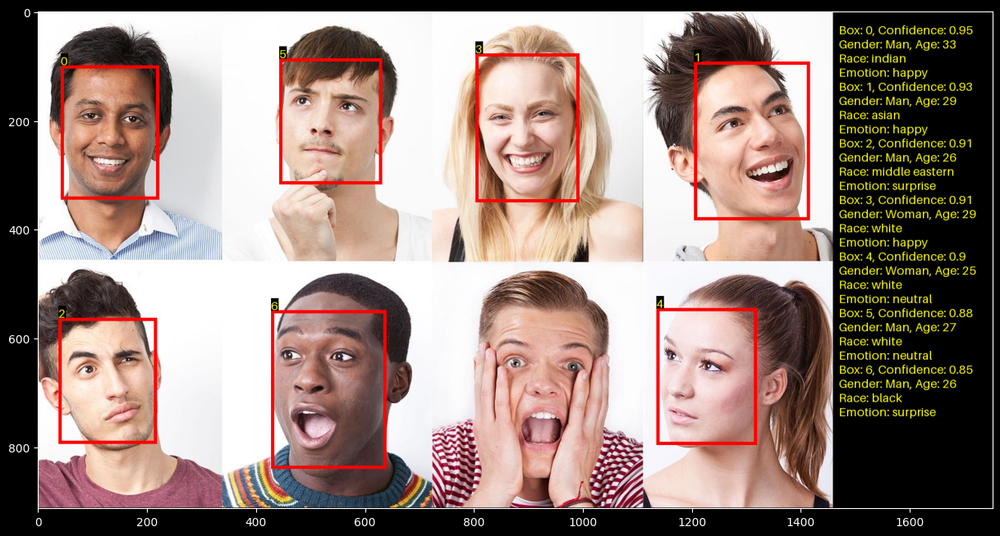

In [ ]:
# чтение исходной картинки (заменить путь на свой)
pil_image1 = Image.open(IMAGE_PATH_1)
draw1 = ImageDraw.Draw(pil_image1)
# ширина и высота исходной картинки
w1, h1 = pil_image1.size

# настройки отрисовки
box_color = 'red'  # цвет бокса
text_color = 'yellow'  # цвет текста
fill_color = 'black'  # цвет заливки текста
font_size = h1 // 40  # размер шрифта текста (в 40 раз меньше чем высота картинки)
font = ImageFont.load_default(size=font_size)  # инициализация шрифта

# текст с результатами детекции со всеми лицами
full_text = ''
# итерация по словарям для каждого лица
for i, res_dict in enumerate(result_dicts):
    # извлечение артибутов
    gender = res_dict['dominant_gender']
    age = res_dict['age']
    confidence = res_dict['face_confidence']
    # левый верхний угол и ширина с высотой бокса
    x, y, w, h, left_eye, right_eye = res_dict['region'].values()
    race = res_dict['dominant_race']
    emotion = res_dict['dominant_emotion']
    # текст который нужно подписать для текущего лица
    text = f'Gender: {gender}, Age: {age}\nRace: {race}\nEmotion: {emotion}'
    # итоговый текст для всех лиц
    full_text += f'Box: {i}, Confidence: {confidence}\n{text}\n'

    # отрисовка боксов для каждого лица
    draw1.rectangle((x, y, x + w, y + h), outline=box_color, width=6)
    # заливка цветом номера лица
    _, _, text_width, text_height = font.getbbox(str(i))
    draw1.rectangle(xy=(x, y - text_height, x + text_width, y), fill=fill_color)
    # подпись номера лица
    draw1.text(xy=(x, y), text=str(i), font=font, fill=text_color, anchor="lb")

# создание второй картинки для отрисовки текста с результатами детекции для каждого лица
# ширина и выстота картиинки с результатами (например ширина в 5 раз меньше чем исходная)
w2 = w1 // 5
h2 = h1
# создание второй картинки
pil_image2 = Image.new('RGB', (w2, h2), fill_color)
draw2 = ImageDraw.Draw(pil_image2)
# нанесение текста на вторую картинку
draw2.text(xy=(10, 20), text=full_text, font=font, fill=text_color)

# соединение первой и второй картинки
fill_img = Image.new('RGB', (w1 + w2, h1), fill_color)
fill_img.paste(pil_image1, (0, 0))
fill_img.paste(pil_image2, (w1, 0))

# отрисовка результата
plt.figure(figsize=(15, 10))
plt.imshow(fill_img)
plt.show()

Та же картинка с другой моделью

In [ ]:
%%time

result_dicts = DeepFace.analyze(
    img_path=IMAGE_PATH_1,  # путь до картинки
    # opencv, yunet, centerface, dlib, ssd, fastmtcnn
    actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
    detector_backend='dlib',  #  детектор по умолчанию
    align=False,  # дополнительное выравнивание перед детекцией, True или False
    enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
    )

24-10-29 17:22:39 - shape_predictor_5_face_landmarks.dat.bz2 is going to be downloaded


Downloading...
From: http://dlib.net/files/shape_predictor_5_face_landmarks.dat.bz2
To: /content/models/.deepface/weights/shape_predictor_5_face_landmarks.dat.bz2
100%|██████████| 5.71M/5.71M [00:00<00:00, 9.27MB/s]
Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.35it/s]

CPU times: user 33.2 s, sys: 1 s, total: 34.2 s
Wall time: 27.1 s


In [ ]:
# одна детекция лишняя
len(result_dicts)

9

In [ ]:
# у нее очень низкая уверенность - 2 процента
result_dicts[-1]

{'age': 31,
 'region': {'x': 675,
  'y': 717,
  'w': 186,
  'h': 186,
  'left_eye': (790, 789),
  'right_eye': (751, 769)},
 'face_confidence': 0.02,
 'gender': {'Woman': 1.4700144529342651, 'Man': 98.5299825668335},
 'dominant_gender': 'Man',
 'race': {'asian': 0.21884906013155342,
  'indian': 1.2402782024608972,
  'black': 90.80657904187316,
  'white': 3.4126086331968684,
  'middle eastern': 3.2418279046909753,
  'latino hispanic': 1.0798567618344284},
 'dominant_race': 'black',
 'emotion': {'angry': 99.97807145118713,
  'disgust': 1.4901300651814614e-27,
  'fear': 4.799416792876138e-14,
  'happy': 0.02192243409808725,
  'sad': 2.71502198501139e-06,
  'surprise': 6.705222242209069e-22,
  'neutral': 9.774447562449495e-06},
 'dominant_emotion': 'angry'}

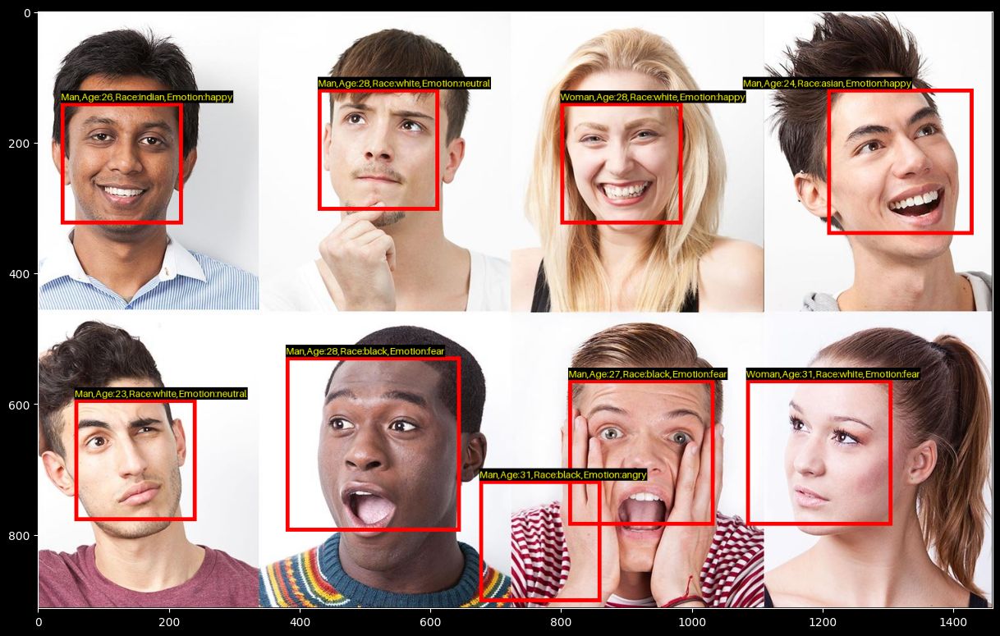

In [ ]:
# открыть картинку и создать объект для рисования
pil_image = Image.open(IMAGE_PATH_1)
draw = ImageDraw.Draw(pil_image)

# настройки отрисовки
box_color = 'red'  # цвет бокса
text_color = 'yellow'  # цвет текста
fill_color = 'black'  # цвет заливки текста

# размер шрифта текста (в 60 раз меньше чем высота картинки)
font_size = pil_image.size[1] // 60
# инициализация шрифта
font = ImageFont.load_default(size=font_size)

# итерация по словарям для каждого лица
for res_dict in result_dicts:
    # извлечение артибутов
    gender = res_dict['dominant_gender']
    age = res_dict['age']
    # левый верхний угол и ширина с высотой бокса
    x, y, w, h, left_eye, right_eye = res_dict['region'].values()
    race = res_dict['dominant_race']
    emotion = res_dict['dominant_emotion']
    # текст который нужно подписать
    text = f'{gender},Age:{age},Race:{race},Emotion:{emotion}'
    # отрисовка боксов и надписей
    draw.rectangle((x, y, x + w, y + h), outline=box_color, width=6)
    # получение итоговой длины и высоты теста чтобы написать его на закрашенном прямоугольнике
    _, _, text_width, text_height = font.getbbox(text)
    # если ширина текста выходит за экран вправо то двигаем текст левее
    if (x + text_width) > pil_image.size[0]:
        x -= text_width / 2
    # отрисовка и заливка сплошным цветом прямоугольника, на котором будет текст
    draw.rectangle(xy=(x, y - text_height, x + text_width, y), fill=fill_color)
    draw.text(xy=(x, y), text=text, font=font, fill=text_color, anchor="lb")

# отрисовка
plt.figure(figsize=(15, 12))
plt.imshow(pil_image)
plt.show()

Та же картинка с другой моделью

In [ ]:
%%time

result_dicts = DeepFace.analyze(
    img_path=IMAGE_PATH_1,  # путь до картинки
    # opencv, yunet, centerface, dlib, ssd, fastmtcnn
    actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
    detector_backend='ssd',  #  детектор по умолчанию
    align=False,  # дополнительное выравнивание перед детекцией, True или False
    enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
    )

24-10-29 17:45:32 - deploy.prototxt will be downloaded...


Downloading...
From: https://github.com/opencv/opencv/raw/3.4.0/samples/dnn/face_detector/deploy.prototxt
To: /content/models/.deepface/weights/deploy.prototxt
28.1kB [00:00, 29.1MB/s]                   


24-10-29 17:45:33 - res10_300x300_ssd_iter_140000.caffemodel will be downloaded...


Downloading...
From: https://github.com/opencv/opencv_3rdparty/raw/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel
To: /content/models/.deepface/weights/res10_300x300_ssd_iter_140000.caffemodel
100%|██████████| 10.7M/10.7M [00:00<00:00, 85.0MB/s]
Action: emotion: 100%|██████████| 4/4 [00:03<00:00,  1.26it/s]

CPU times: user 28.4 s, sys: 327 ms, total: 28.8 s
Wall time: 21.3 s


In [ ]:
# одна детекция лишняя
len(result_dicts)

8

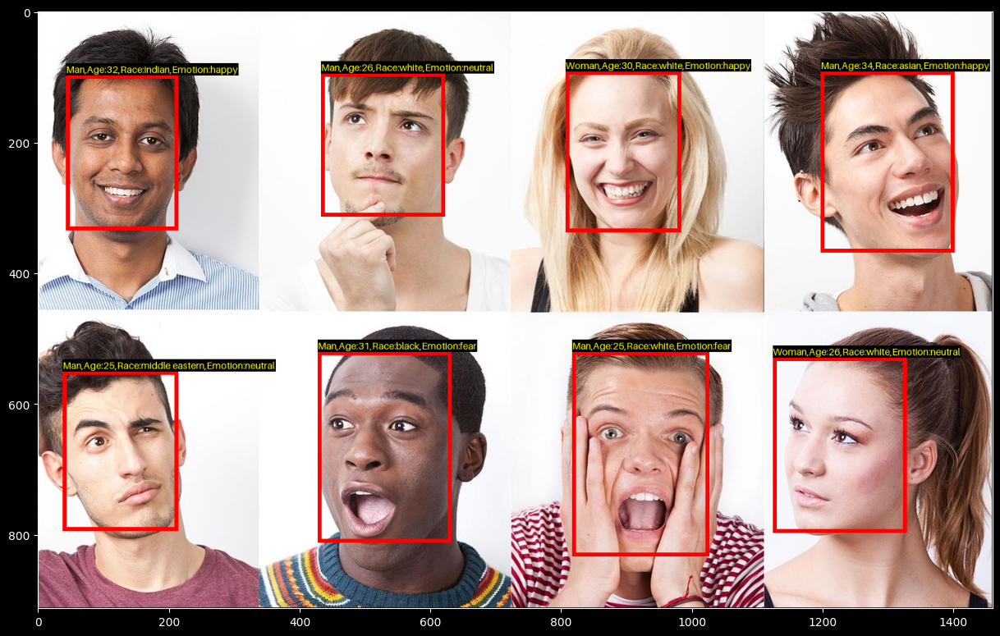

In [ ]:
# открыть картинку и создать объект для рисования
pil_image = Image.open(IMAGE_PATH_1)
draw = ImageDraw.Draw(pil_image)

# настройки отрисовки
box_color = 'red'  # цвет бокса
text_color = 'yellow'  # цвет текста
fill_color = 'black'  # цвет заливки текста

# размер шрифта текста (в 60 раз меньше чем высота картинки)
font_size = pil_image.size[1] // 60
# инициализация шрифта
font = ImageFont.load_default(size=font_size)

# итерация по словарям для каждого лица
for res_dict in result_dicts:
    # извлечение артибутов
    gender = res_dict['dominant_gender']
    age = res_dict['age']
    # левый верхний угол и ширина с высотой бокса
    x, y, w, h, left_eye, right_eye = res_dict['region'].values()
    race = res_dict['dominant_race']
    emotion = res_dict['dominant_emotion']
    # текст который нужно подписать
    text = f'{gender},Age:{age},Race:{race},Emotion:{emotion}'
    # отрисовка боксов и надписей
    draw.rectangle((x, y, x + w, y + h), outline=box_color, width=6)
    # получение итоговой длины и высоты теста чтобы написать его на закрашенном прямоугольнике
    _, _, text_width, text_height = font.getbbox(text)
    # если ширина текста выходит за экран вправо то двигаем текст левее
    if (x + text_width) > pil_image.size[0]:
        x -= text_width / 2
    # отрисовка и заливка сплошным цветом прямоугольника, на котором будет текст
    draw.rectangle(xy=(x, y - text_height, x + text_width, y), fill=fill_color)
    draw.text(xy=(x, y), text=text, font=font, fill=text_color, anchor="lb")

# отрисовка
plt.figure(figsize=(15, 12))
plt.imshow(pil_image)
plt.show()

Другая картинка

In [ ]:
%%time

# при первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше
result_dicts = DeepFace.analyze(
    img_path=IMAGE_PATH_2,  # путь до картинки
    actions=['age', 'gender', 'race', 'emotion'],  # действия которые нужено классифицировать
    detector_backend='centerface',  # поставить другой бэкенд
    align=False,  # с алгоритмом yunet нужно установить False иначе находит только одно лицо
    enforce_detection=True,  # True значит что если лица не найдены, то будет ошибка
    )

Action: emotion: 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]

CPU times: user 5.82 s, sys: 1.16 s, total: 6.98 s
Wall time: 4.03 s


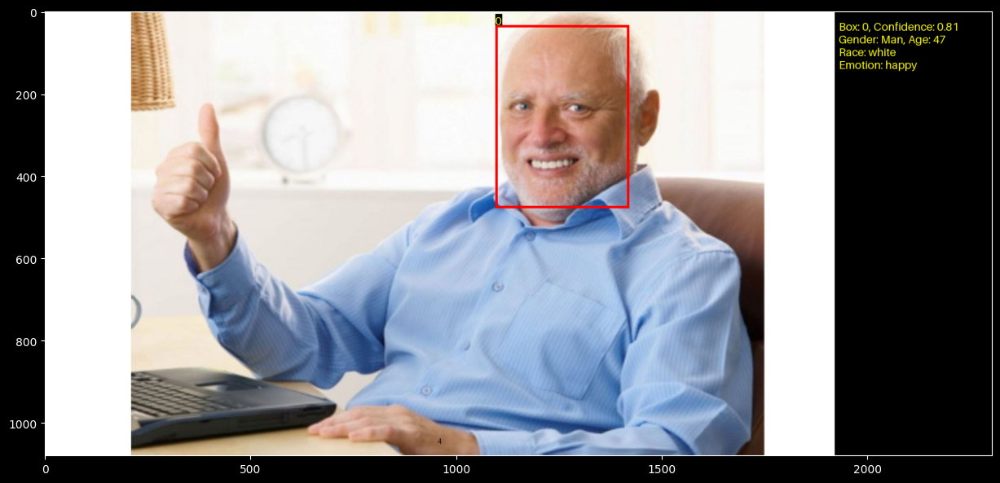

In [ ]:
# чтение исходной картинки
pil_image1 = Image.open(IMAGE_PATH_2)
draw1 = ImageDraw.Draw(pil_image1)
# ширина и высота исходной картинки
w1, h1 = pil_image1.size

# настройки отрисовки
box_color = 'red'  # цвет бокса
text_color = 'yellow'  # цвет текста
fill_color = 'black'  # цвет заливки текста
font_size = h1 // 40  # размер шрифта текста (в 40 раз меньше чем высота картинки)
font = ImageFont.load_default(size=font_size)  # инициализация шрифта

# текст с результатами детекции со всеми лицами
full_text = ''
# итерация по словарям для каждого лица
for i, res_dict in enumerate(result_dicts):
    # извлечение артибутов
    gender = res_dict['dominant_gender']
    age = res_dict['age']
    confidence = res_dict['face_confidence']
    # левый верхний угол и ширина с высотой бокса
    x, y, w, h, left_eye, right_eye = res_dict['region'].values()
    race = res_dict['dominant_race']
    emotion = res_dict['dominant_emotion']
    # текст который нужно подписать для текущего лица
    text = f'Gender: {gender}, Age: {age}\nRace: {race}\nEmotion: {emotion}'
    # итоговый текст для всех лиц
    full_text += f'Box: {i}, Confidence: {confidence}\n{text}\n'

    # отрисовка боксов для каждого лица
    draw1.rectangle((x, y, x + w, y + h), outline=box_color, width=6)
    # заливка цветом номера лица
    _, _, text_width, text_height = font.getbbox(str(i))
    draw1.rectangle(xy=(x, y - text_height, x + text_width, y), fill=fill_color)
    # подпись номера лица
    draw1.text(xy=(x, y), text=str(i), font=font, fill=text_color, anchor="lb")

# создание второй картинки для отрисовки текста с результатами детекции для каждого лица
# ширина и выстота картиинки с результатами (например ширина в 5 раз меньше чем исходная)
w2 = w1 // 5
h2 = h1
# создание второй картинки
pil_image2 = Image.new('RGB', (w2, h2), fill_color)
draw2 = ImageDraw.Draw(pil_image2)
# нанесение текста на вторую картинку
draw2.text(xy=(10, 20), text=full_text, font=font, fill=text_color)

# соединение первой и второй картинки
fill_img = Image.new('RGB', (w1 + w2, h1), fill_color)
fill_img.paste(pil_image1, (0, 0))
fill_img.paste(pil_image2, (w1, 0))

# отрисовка результата
plt.figure(figsize=(15, 10))
plt.imshow(fill_img)
plt.show()

Работа с отдельными моделями (взято из исходников репозитория)

In [ ]:
# документация метода build_model
print(DeepFace.build_model.__doc__)


    This function builds a pre-trained model
    Args:
        model_name (str): model identifier
            - VGG-Face, Facenet, Facenet512, OpenFace, DeepFace, DeepID, Dlib,
                ArcFace, SFace, GhostFaceNet for face recognition
            - Age, Gender, Emotion, Race for facial attributes
            - opencv, mtcnn, ssd, dlib, retinaface, mediapipe, yolov8, yunet,
                fastmtcnn or centerface for face detectors
            - Fasnet for spoofing
        task (str): facial_recognition, facial_attribute, face_detector, spoofing
            default is facial_recognition
    Returns:
        built_model
    


In [ ]:
# инициализация модели для детекции лиц
face_model = DeepFace.build_model(
    model_name='opencv',
    task='face_detector',
    )

In [ ]:
# детекция лиц
np_image = np.array(Image.open(IMAGE_PATH))
faces = face_model.detect_faces(np_image)
# результаты
faces

In [ ]:
# результат
faces[0].__dict__

{'x': 2229,
 'y': 147,
 'w': 167,
 'h': 167,
 'left_eye': (2340, 214),
 'right_eye': (2278, 215),
 'confidence': 0.9032552394206869}

In [ ]:
# инициализация модели для предсказания возраста
age_model = DeepFace.build_model(
    model_name='Age',
    task='facial_attribute',
    )

24-10-22 09:45:29 - age_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/age_model_weights.h5
To: /root/.deepface/weights/age_model_weights.h5
100%|██████████| 539M/539M [00:08<00:00, 64.0MB/s]


In [ ]:
# предсказание возраста (на всей картинке для упрощение примера)
np_image = np.array(Image.open(IMAGE_PATH).resize((224, 224)))[None]
age = age_model.predict(np_image)
age

34.46982848840793

## Детекция только лиц

Детекция координат найденных лиц, координат глаз, уверенности и сами лица в формате numpy

In [ ]:
# какие бекенды можно выбрать (для установки некоторых требуется установка соотвествующих библиотек)
backends = ['opencv', 'ssd', 'dlib', 'mtcnn', 'fastmtcnn', 'retinaface', 'mediapipe', 'yolov8', 'yunet', 'centerface']

In [ ]:
%%time

# при первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше
face_objs = DeepFace.extract_faces(
  img_path=IMAGE_PATH,
  detector_backend='opencv',
  align=True,
  anti_spoofing=True,  # определяет лицо настоящее или сгенерированное
)

CPU times: user 18.6 s, sys: 819 ms, total: 19.5 s
Wall time: 17.3 s


In [ ]:
# возвращает координаты найденных лиц, глаз, уверенности и сами лица в формате numpy
face_objs

[{'face': array([[[0.06666667, 0.03137255, 0.00784314],
          [0.06666667, 0.03137255, 0.00392157],
          [0.09411765, 0.05882353, 0.03137255],
          ...,
          [0.99607843, 0.99607843, 0.99607843],
          [0.99607843, 0.99607843, 0.99607843],
          [0.99607843, 0.99607843, 0.99607843]],
  
         [[0.08627451, 0.05098039, 0.02352941],
          [0.08235294, 0.04705882, 0.01960784],
          [0.10980392, 0.0745098 , 0.04705882],
          ...,
          [0.99607843, 0.99607843, 0.99607843],
          [0.99607843, 0.99607843, 0.99607843],
          [0.99607843, 0.99607843, 0.99607843]],
  
         [[0.10196078, 0.06666667, 0.03921569],
          [0.09411765, 0.05882353, 0.03137255],
          [0.1254902 , 0.09019608, 0.0627451 ],
          ...,
          [0.99607843, 0.99607843, 0.99607843],
          [0.99607843, 0.99607843, 0.99607843],
          [0.99607843, 0.99607843, 0.99607843]],
  
         ...,
  
         [[0.99607843, 0.99607843, 0.99215686],
      

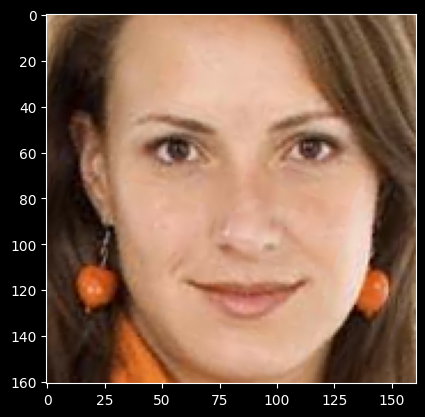

In [ ]:
# лицо под индексом 3
plt.imshow(face_objs[3]['face']);

In [ ]:
# этот лицо настоящее
face_objs[3]['is_real']

True

## Поиск лица в базе лиц

Имеется фото лица человека, и папка с фотографиями разных людей, нужно найти в этой папке все лица, которые принадлежат человеку

Проверка когда лицо и база лиц принадлежат одному и тому же человеку

In [ ]:
%%time

# фото лица которое нужно найти
img_path = '/content/Face Data/Face Dataset/0/1.jpg'
# путь до базы папки с лицами
db_path = '/content/Face Data/Face Dataset/0'

# при первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше
dfs = DeepFace.find(
    img_path=img_path,  # фото лица которое нужно найти
    db_path=db_path,  # путь до базы папки с лицами
    detector_backend='opencv',
    align=True,
)

24-10-21 09:48:31 - Found 4 newly added image(s), 0 removed image(s), 0 replaced image(s).


Finding representations:   0%|          | 0/4 [00:00<?, ?it/s]

24-10-21 09:48:34 - vgg_face_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/vgg_face_weights.h5
To: /root/.deepface/weights/vgg_face_weights.h5

  0%|          | 0.00/580M [00:00<?, ?B/s]
  3%|▎         | 15.2M/580M [00:00<00:03, 149MB/s]
  7%|▋         | 43.0M/580M [00:00<00:02, 222MB/s]
 11%|█▏        | 65.5M/580M [00:00<00:02, 186MB/s]
 15%|█▍        | 85.5M/580M [00:00<00:02, 189MB/s]
 18%|█▊        | 106M/580M [00:00<00:02, 193MB/s] 
 22%|██▏       | 126M/580M [00:00<00:02, 196MB/s]
 25%|██▌       | 146M/580M [00:00<00:02, 182MB/s]
 30%|██▉       | 172M/580M [00:00<00:02, 204MB/s]
 34%|███▍      | 197M/580M [00:00<00:01, 216MB/s]
 38%|███▊      | 219M/580M [00:01<00:02, 179MB/s]
 41%|████      | 238M/580M [00:01<00:02, 161MB/s]
 44%|████▍     | 256M/580M [00:01<00:01, 165MB/s]
 48%|████▊     | 276M/580M [00:01<00:01, 175MB/s]
 51%|█████     | 295M/580M [00:01<00:01, 175MB/s]
 54%|█████▍    | 314M/580M [00:01<00:01, 174MB/s]
 57%|█████▋    | 333M/580M [00:01<00:01, 177M

24-10-21 09:48:49 - There are now 4 representations in ds_model_vggface_detector_opencv_aligned_normalization_base_expand_0.pkl
24-10-21 09:48:49 - Searching /content/Face Data/Face Dataset/0/1.jpg in 4 length datastore
24-10-21 09:48:51 - find function duration 20.413559913635254 seconds
CPU times: user 11.9 s, sys: 6.49 s, total: 18.4 s
Wall time: 20.4 s


In [ ]:
# результаты
dfs

[                                  identity  \
 0  /content/Face Data/Face Dataset/0/1.jpg   
 1  /content/Face Data/Face Dataset/0/0.jpg   
 2  /content/Face Data/Face Dataset/0/2.jpg   
 3  /content/Face Data/Face Dataset/0/3.jpg   
 
                                        hash  target_x  target_y  target_w  \
 0  1024ea4ef7f1938e587b4c2cf38d782ba8643580        71        71       111   
 1  8ec377c08e1f04cb6f9b501933039bd3a4594f77        70        67       117   
 2  480749e5e04249b41f397612b65d46d91164beaa        69        68       114   
 3  fb66704603b52d052945108d0443d8183bdf1e84        71        68       111   
 
    target_h  source_x  source_y  source_w  source_h  threshold  distance  
 0       111        71        71       111       111       0.68  0.000000  
 1       117        71        71       111       111       0.68  0.343459  
 2       114        71        71       111       111       0.68  0.476684  
 3       111        71        71       111       111       0.68  0.

Проверка когда в базе другие люди

In [ ]:
%%time

# фото лица которое нужно найти
img_path = '/content/Face Data/Face Dataset/0/1.jpg'
# путь до базы папки с лицами
db_path = '/content/Face Data/Face Dataset/100'

dfs = DeepFace.find(
    img_path=img_path,  # фото лица которое нужно найти
    db_path=db_path,  # путь до базы папки с лицами
    detector_backend='opencv',
    align=True,
)

24-10-21 09:50:11 - Found 2 newly added image(s), 0 removed image(s), 0 replaced image(s).


Finding representations: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]


24-10-21 09:50:13 - There are now 2 representations in ds_model_vggface_detector_opencv_aligned_normalization_base_expand_0.pkl
24-10-21 09:50:13 - Searching /content/Face Data/Face Dataset/0/1.jpg in 2 length datastore
24-10-21 09:50:14 - find function duration 2.4366683959960938 seconds
CPU times: user 4.1 s, sys: 42.1 ms, total: 4.14 s
Wall time: 2.44 s


In [ ]:
# в результате в базе лиц не найдено лицо img_path
dfs

[Empty DataFrame
 Columns: [identity, hash, target_x, target_y, target_w, target_h, source_x, source_y, source_w, source_h, threshold, distance]
 Index: []]

## Сравнение двух изображений лиц

Сравнить насколько похожи два фото

In [ ]:
# какие модели можно выбрать (для установки некоторых требуется установка соотвествующих библиотек)
backends = ['opencv', 'ssd', 'dlib', 'mtcnn', 'fastmtcnn', 'retinaface', 'mediapipe', 'yolov8', 'yunet', 'centerface']
detectors = ['retinaface', 'mtcnn', 'fastmtcnn', 'dlib', 'yolov8', 'yunet', 'centerface', 'mediapipe', 'ssd', 'opencv', 'skip']

Сравнение лиц одного и того же человека

In [ ]:
%%time

# лица из одной папки датасета который был загружен выше
image_path1 = '/content/Face Data/Face Dataset/0/1.jpg'
image_path2 = '/content/Face Data/Face Dataset/0/2.jpg'

# при первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше
result = DeepFace.verify(
    img1_path=image_path1,
    img2_path=image_path2,
    model_name='ArcFace',
    detector_backend='ssd',
    distance_metric='cosine',  # метрика расстояния
    align=True,
    enforce_detection=False,
)

24-10-21 09:50:24 - arcface_weights.h5 will be downloaded to /root/.deepface/weights/arcface_weights.h5


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/arcface_weights.h5
To: /root/.deepface/weights/arcface_weights.h5
100%|██████████| 137M/137M [00:01<00:00, 119MB/s]


24-10-21 09:50:26 - deploy.prototxt will be downloaded...


Downloading...
From: https://github.com/opencv/opencv/raw/3.4.0/samples/dnn/face_detector/deploy.prototxt
To: /root/.deepface/weights/deploy.prototxt
28.1kB [00:00, 37.7MB/s]                   


24-10-21 09:50:27 - res10_300x300_ssd_iter_140000.caffemodel will be downloaded...


Downloading...
From: https://github.com/opencv/opencv_3rdparty/raw/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel
To: /root/.deepface/weights/res10_300x300_ssd_iter_140000.caffemodel
100%|██████████| 10.7M/10.7M [00:00<00:00, 147MB/s]


CPU times: user 5.16 s, sys: 1.03 s, total: 6.2 s
Wall time: 7.09 s


In [ ]:
# верификация пройдена - значит расстояние (косинусная мера) между векторами лиц меньше чем threshold (0.68)
result

{'verified': True,
 'distance': 0.26971911011580263,
 'threshold': 0.68,
 'model': 'ArcFace',
 'detector_backend': 'ssd',
 'similarity_metric': 'cosine',
 'facial_areas': {'img1': {'x': 70,
   'y': 58,
   'w': 96,
   'h': 132,
   'left_eye': (146, 115),
   'right_eye': (105, 113)},
  'img2': {'x': 81,
   'y': 63,
   'w': 84,
   'h': 113,
   'left_eye': None,
   'right_eye': None}},
 'time': 7.09}

Сравнение лиц разных людей

In [ ]:
%%time

# лица из одной папки датасета который был загружен выше
image_path1 = '/content/Face Data/Face Dataset/0/1.jpg'
image_path2 = '/content/Face Data/Face Dataset/100/0.jpg'

# при первом запуске всегдла происходит загрузка моделей - поэтому время инференса дольше
result = DeepFace.verify(
    img1_path=image_path1,
    img2_path=image_path2,
    model_name='ArcFace',
    detector_backend='ssd',
    distance_metric='cosine',  # метрика расстояния
    align=True,
    enforce_detection=False,
)

CPU times: user 1.67 s, sys: 43.2 ms, total: 1.72 s
Wall time: 1.74 s


In [ ]:
# верификация не пройдена - значит расстояние (косинусная мера) между векторами лиц больше чем threshold (0.68)
result

{'verified': False,
 'distance': 0.9257757624528392,
 'threshold': 0.68,
 'model': 'ArcFace',
 'detector_backend': 'ssd',
 'similarity_metric': 'cosine',
 'facial_areas': {'img1': {'x': 70,
   'y': 58,
   'w': 96,
   'h': 132,
   'left_eye': (146, 115),
   'right_eye': (105, 113)},
  'img2': {'x': 85,
   'y': 70,
   'w': 81,
   'h': 110,
   'left_eye': (141, 108),
   'right_eye': (107, 114)}},
 'time': 1.74}

# Класс детектора

## Установка библиотеки и импорты

Установка библиотеки DeepFace

In [ ]:
!pip install -q deepface python-ffmpeg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 52.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 46.3 MB/s eta 0:00:00


In [ ]:
# версия библиотеки на момент запуска (октябрь 2024)
!pip list | grep deepface python-ffmpeg

grep: python-ffmpeg: No such file or directory
ERROR: Pipe to stdout was broken
Exception ignored in: <_io.TextIOWrapper name='<stdout>' mode='w' encoding='utf-8'>
BrokenPipeError: [Errno 32] Broken pipe


Импорты

In [ ]:
import os
from pathlib import Path

MODELS_DIR = Path('models')
os.environ['DEEPFACE_HOME'] = str(MODELS_DIR)

import tempfile
from dataclasses import dataclass
from tqdm.notebook import tqdm_notebook

import cv2
import numpy as np
import pandas as pd

from PIL import Image, ImageDraw, ImageFont
from deepface import DeepFace

# from streamlit.runtime.uploaded_file_manager import UploadedFile
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (8, 4)
plt.style.use('dark_background')

24-10-29 11:35:53 - Directory models/.deepface has been created
24-10-29 11:35:53 - Directory models/.deepface/weights has been created


## Загрузка примеров

Загрузка примеров фото и видео для проверки детектора

In [ ]:
# загрука изображения
IMAGE_PATH = 'image.jpg'
if not Path(IMAGE_PATH).exists():
    !wget -qq -O "{IMAGE_PATH}" --show-progress http://dalma.news/wp-content/uploads/2018/09/residencia-profesional.jpg

# загрузка примера видео
VIDEO_PATH = 'video_example.mp4'
if not Path(VIDEO_PATH).exists():
    !gdown 1KoPJZlGdQfKPWv1oaGawWqFLp_Z5DXu5 -O "{VIDEO_PATH}"

# загрузка изображения с лицами
IMAGE_PATH_1 = "emotions.jpg"
if not Path(IMAGE_PATH_1).exists():
    !wget -qq -O "{IMAGE_PATH_1}" --show-progress https://mykaleidoscope.ru/x/uploads/posts/2022-10/1666265946_37-mykaleidoscope-ru-p-motornie-komponenti-emotsii-krasivo-43.jpg

# загрузка с одним лицом
IMAGE_PATH_2 = "father.jpg"
if not Path(IMAGE_PATH_2).exists():
    !wget -qq -O "{IMAGE_PATH_2}" --show-progress https://files.speakerdeck.com/presentations/91b75a0a493b4fb698af79e6962cbd4e/slide_3.jpg

# загрузка изображения без лица
IMAGE_PATH_3 = "слоны.jpg"
if not Path(IMAGE_PATH_3).exists():
    !gdown 1h6vR1K2un0okzx2lfjQtuvvzfTBcNXdF -O "{IMAGE_PATH_3}"

image.jpg           100%[===================>] 294.34K   759KB/s    in 0.4s    
Downloading...
From: https://drive.google.com/uc?id=1KoPJZlGdQfKPWv1oaGawWqFLp_Z5DXu5
To: /content/video_example.mp4
100% 468k/468k [00:00<00:00, 5.56MB/s]
emotions.jpg        100%[===================>] 234.74K   385KB/s    in 0.6s    
father.jpg          100%[===================>] 117.18K  --.-KB/s    in 0.02s   
Downloading...
From: https://drive.google.com/uc?id=1h6vR1K2un0okzx2lfjQtuvvzfTBcNXdF
To: /content/слоны.jpg
100% 287k/287k [00:00<00:00, 5.29MB/s]


## Класс детектора

In [ ]:
import os
from pathlib import Path
from dataclasses import dataclass
from typing import Generator

import cv2
import numpy as np
import pandas as pd

from PIL import Image, ImageDraw, ImageFont
from ffmpeg import FFmpeg

# настрока чтобы модели скачивались в папку models
MODELS_DIR = Path('models')
os.environ['DEEPFACE_HOME'] = str(MODELS_DIR)


# настройка Tensorflow чтобы не вылетало если мало памяти
import tensorflow as tf

os.environ['TF_GPU_ALLOCATOR'] = 'cuda_malloc_async'
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as ex:
        print(ex)


from deepface import DeepFace


# словарь для детекции одного лица который возвращает библиотека DeepFace
DEEPFACE_DICT = dict[str, str | int | float | dict[str, str | int | float | None]]

# датакласс для хранения результатов детекции
# если лиц не обнаружено (face_conf = 0) то устанавливает все значения на None
@dataclass
class DetectResult:
    face_conf: float | None = None  # уверенность детекции лица
    gender: str | None = None  # пол
    gender_conf: float | None = None  # уверенность пола
    age: int | None = None  # возраст
    race: str | None = None  # раса
    race_conf: float | None = None  # уверенность рассы
    emotion: str | None = None  # эмоция
    emotion_conf: float | None = None  # уверенность эмоции
    x: int | None = None  # координата x левого верхнего угла бокса
    y: int | None = None  # координата y левого верхнего угла бокса
    w: int | None = None  # ширина бокса
    h: int | None = None  # высота бокса


    # если лиц не обнаружено (face_conf = 0) то устанавливает все значения на None
    def __post_init__(self):
        if self.face_conf == 0:
            self.__dict__.update(DetectResult().__dict__)


    # формирование экземпляра из словаря, который возвращает библиотека DeepFace
    @classmethod
    def from_dict(cls, detect_dict: DEEPFACE_DICT):
        return cls(
            face_conf=detect_dict['face_confidence'],
            gender=detect_dict['dominant_gender'],
            gender_conf=detect_dict['gender'][detect_dict['dominant_gender']],
            age=detect_dict['age'],
            race=detect_dict['dominant_race'],
            race_conf=detect_dict['race'][detect_dict['dominant_race']],
            emotion=detect_dict['dominant_emotion'],
            emotion_conf=detect_dict['emotion'][detect_dict['dominant_emotion']],
            x=detect_dict['region']['x'],
            y=detect_dict['region']['y'],
            w=detect_dict['region']['w'],
            h=detect_dict['region']['h'],
        )


    # вернуть текущий экземпляр в качестве словаря
    def as_dict(self):
        return self.__dict__


    # получить названия атрибутов экземпляра
    def keys(self):
        return self.__dict__.keys()


    # видоизменить текстовое представление экземпляра
    def __repr__(self):
        if self.face_conf is None:
            repr_text = f'DetectResult(face_conf=None'
        else:
            repr_text = 'DetectResult(\n  ' + \
                '\n  '.join([f'{k}={v}' for k, v in self.as_dict().items()])
        return repr_text + '\n)\n'


class Detector:
    def __init__(self):
        # настройки цветов боксов и текста
        self.box_color = 'red'
        self.text_color = 'yellow'
        self.fill_color = 'black'
        self.font_path = 'fonts/LiberationMono-Regular.ttf'
        self.font_scale = 50  # чем меньше тем больше шрифт
        # список с результатами детекции
        self.detections_all_frames = []
        # путь до видео в которое будут записыватся результаты детекции
        self.save_video_path = 'result_video.mp4'
        # путь куда сохранять датафрейм с аннотациями к видео
        self.result_csv_path = 'video_annotations.csv'
        # бэкенд детектора по умолчанию
        self.detector_backend = 'yunet'  # opencv, yunet
        # загрузка весов если они еще не были загружены
        weights_dir = MODELS_DIR / '.deepface' / 'weights'
        # флаг is_first_run для отображения первоначальной инициализации в Streamlit
        # если DeepFace запускается первый раз то сначала он инициализирует веса
        self.is_first_run = True

        if Path(self.result_csv_path).is_file():
            Path(self.result_csv_path).unlink(missing_ok=True)

        if len(list(weights_dir.iterdir())) == 0:
            self.first_detect_and_load_weights()


    # детекция случайной картинки из шума чтобы при первом запуске загрузились веса
    def first_detect_and_load_weights(self):
        DeepFace.analyze(
            img_path=np.random.randint(0, 256, size=(28, 28, 3), dtype=np.uint8),
            actions=['age', 'gender', 'race', 'emotion'],
            detector_backend=self.detector_backend,
            align=False,
            enforce_detection=False,
            silent=True,
            )


    # детекция одного изображения, возаращает список со словарями результатов детекций
    def detect_image(self, image: str | np.ndarray, actions: list[str], align: bool) -> list[DetectResult]:
        detection_dicts = DeepFace.analyze(
            img_path=image,
            actions=actions,
            detector_backend=self.detector_backend,
            align=align,
            enforce_detection=False,
            silent=True,
            )
        detections = [DetectResult.from_dict(detection) for detection in detection_dicts]
        return detections


    # отрисовка результатов для детекций
    def draw_detections(
            self,
            np_image_rgb: np.ndarray,
            detections: list[DetectResult],
            face_conf_threshold: float,
            ) -> np.ndarray:
        # чтение изображения PIL для отрисовки результатов
        pil_image = Image.fromarray(np_image_rgb)
        # создание объекта для рисования
        draw = ImageDraw.Draw(pil_image)
        # расчет размера шрифта в зависимости от высоты изображения
        font_size = pil_image.size[1] // self.font_scale
        # инициализация шрифта
        # font = ImageFont.load_default(size=font_size)
        font = ImageFont.truetype(self.font_path, size=font_size)
        # итерация по словарям с детекциями
        for detection in detections:
            # если лицо обнаружено
            if detection.face_conf is not None:
                if detection.face_conf > face_conf_threshold:
                    # получение координат бокса
                    x, y, w, h = detection.x, detection.y, detection.w, detection.h
                    # формирования текста для отрисовки
                    text = f'{detection.gender},{detection.age},{detection.race},{detection.emotion}'
                    # отрисовка бокса для лица
                    draw.rectangle((x, y, x + w, y + h), outline=self.box_color, width=6)
                    # получение ширины и высоты прямоугольника для заливки текста
                    _, _, text_width, text_height = font.getbbox(text)
                    # если текст выходи за края изображения вправо - сдвинуть его влево наполвину
                    if (x + text_width) > pil_image.size[0]:
                        x -= text_width / 2
                    # отрисовка заливки для текста
                    draw.rectangle(xy=(x, y - text_height, x + text_width, y), fill=self.fill_color)
                    # отрисовка текста
                    draw.text(xy=(x, y), text=text, font=font, fill=self.text_color, anchor='lb')
        return np.array(pil_image)


    # функция - генератор для детекция видео, который детектит кадры видео в цикле
    # возвращает номер текущего кадра и общее кол-во кадров, чтобы сделать внешний прогресс бар
    def detect_video(
            self,
            video_file: str | Path,
            actions: list[str],
            align: bool,
            face_conf_threshold: float,
            ) -> Generator[tuple[int, int], None, None]:

        # чтение видеофайла
        cap_read = cv2.VideoCapture(str(video_file))
        # получение параметров видео - ширина, высота, fps, кол-во кадров
        frames_width = int(cap_read.get(cv2.CAP_PROP_FRAME_WIDTH))
        frames_height = int(cap_read.get(cv2.CAP_PROP_FRAME_HEIGHT))
        frames_fps = int(cap_read.get(cv2.CAP_PROP_FPS))
        total_frames = int(cap_read.get(cv2.CAP_PROP_FRAME_COUNT))

        # инициализация видео для записи
        cap_write = cv2.VideoWriter(
            filename=self.save_video_path,
            fourcc=cv2.VideoWriter_fourcc(*'mp4v'),
            fps=frames_fps,
            frameSize=(frames_width, frames_height),
            )

        # список для сбора словарей с результатами
        self.detections_all_frames = []
        # счетчик текущего кадра
        frames_count = 0

        # бесконечный цикл - пока видео открыто на чтение
        while cap_read.isOpened():
            # считывание текущего кадра видео
            ret, np_image_bgr = cap_read.read()
            if not ret:
                break
            # детекция текущего кадра
            detections = self.detect_image(
                image=np_image_bgr,
                actions=actions,
                align=align,
                )
            self.detections_all_frames.append(detections)

            # если хотя бы одно лицо обнаружено то сделать отрисовку на текущем кадре
            if detections[0].face_conf is not None:
                np_image_rgb = cv2.cvtColor(np_image_bgr, cv2.COLOR_BGR2RGB)
                result_np_image = self.draw_detections(
                    np_image_rgb=np_image_rgb,
                    detections=detections,
                )
                np_image_bgr = cv2.cvtColor(result_np_image, cv2.COLOR_RGB2BGR)

            # запись отрисованного кадра в видео результат
            cap_write.write(np_image_bgr)
            frames_count += 1
            # генерация текущего номера кадра и сколько всего кадров в видео
            yield (frames_count, total_frames)

        # закрыть видео
        cap_write.release()
        cap_read.release()


    # создание датафрейма из словарей с результатами детекции
    # каждая строка датафрейма - порядковый номер кадра из видео
    # если на кадре ничего нет то все значения кроме номера кадра и времени видео будут None
    # если на кадре несколько лиц - номера кадров и время видео будут дублироваться
    def detections_to_df(self) -> pd.DataFrame:
        if not Path(self.save_video_path).exists():
            print('Нет видео с результатами детекции')
            return None

        if len(self.detections_all_frames) == 0:
            print('Не найдено ни одного объекта')
            return None

        # получение FPS видео
        cap_read = cv2.VideoCapture(str(self.save_video_path))
        frames_fps = int(cap_read.get(cv2.CAP_PROP_FPS))
        cap_read.release()

        # получение всех детекций в одном списке
        # detections = sum(self.detections_all_frames, [])
        # detections = [detect_res.as_dict() for detect_res in detections]
        df_list = []
        for frame_num, detections in enumerate(self.detections_all_frames, start=1):
            for detection in detections:
                df_list.append({'frame_num': frame_num, **detection.as_dict()})

        # инициализация датафрейма
        df = pd.DataFrame(df_list)
        # добавление столбца с секундой текущего кадра
        df.insert(loc=1, column='frame_sec', value=df.frame_num / frames_fps)
        # столбец, который указывает, было ли лицо обнаружено
        df['face_detected'] = df['gender'].notna().astype(int)
        # сохранение датафрейма
        df.to_csv(self.result_csv_path, index=False)
        return self.result_csv_path


    # конвертация в mp4
    @staticmethod
    def convert_mp4(input_video_path: str | Path, output_video_path: str | Path) -> None:
        # инициализация объекта FFmpeg и конвертация
        ffmpeg = FFmpeg().option('y').input(input_video_path).output(output_video_path)
        ffmpeg.execute()


# инициализация детектора
detector_model = Detector()

## Проверка детектора на фото

In [ ]:
%%time

# инициализация детектора
detector = Detector()
# detector.first_detect_and_load_weights()
# какие действия нужно детектить
actions = ['age', 'gender', 'race', 'emotion']
# применять ли дополнительное выравнивание
align = False
# порог уверенности для обнаружения лиц
face_conf_threshold = 0.5

# чтение изображения
np_image_bgr = cv2.imread(IMAGE_PATH_2)
# детекция
detections = detector.detect_image(
    image=np_image_bgr,
    actions=actions,
    align=align,
    )
# переаод в RGB перед отрисовкой
np_image_rgb = cv2.cvtColor(np_image_bgr, cv2.COLOR_BGR2RGB)
# отрисовка результата
result_np_image = detector.draw_detections(
    np_image_rgb=np_image_rgb,
    detections=detections,
    face_conf_threshold=face_conf_threshold,
    )

CPU times: user 140 ms, sys: 24.1 ms, total: 164 ms
Wall time: 158 ms


In [ ]:
# список результатов детекции в формате DetectResult
detections

[DetectResult(
   face_conf=0.93
   gender=Man
   gender_conf=98.32842946052551
   age=47
   race=white
   race_conf=99.99113082885742
   emotion=happy
   emotion_conf=99.98438358306885
   x=1089
   y=51
   w=315
   h=426
 )]

Отрисовка результата

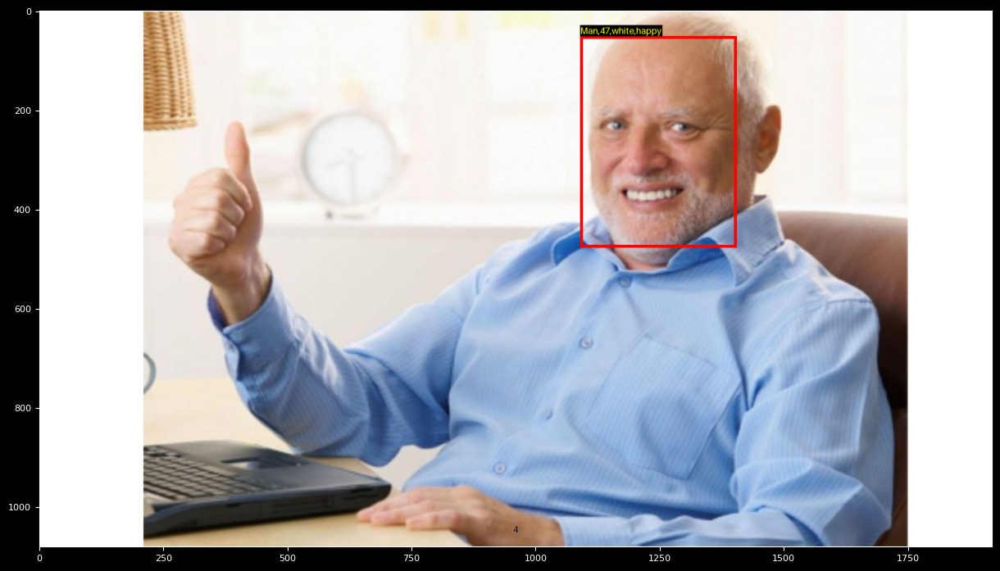

In [ ]:
plt.figure(figsize=(15, 10))
plt.imshow(result_np_image)
plt.show()

## Проверка детектора на видео

Загрузка видео с TikTok

In [ ]:
# https://github.com/krypton-byte/tiktok-downloader
!pip install -q tiktok_downloader

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.7/99.7 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.0/78.0 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 2.7 MB/s eta 0:00:00


In [ ]:
# https://vt.tiktok.com/ZSjFaWkD1/  # 51 сек
# https://vt.tiktok.com/ZSjFavTJN/  # 45 сек
# https://vt.tiktok.com/ZSjFannw6/  # 23 сек
# https://vt.tiktok.com/ZSjFamN59/  # 50 сек

!python -m tiktok_downloader --url https://vt.tiktok.com/ZSjFannw6/ --snaptik --save tiktok.mp4

Детекция

In [ ]:
%%time

# Colab T4 GPU Time:  2min 29s

# инициализация детектора
detector = Detector()
# какие действия нужно детектить
actions = ['age', 'gender', 'race', 'emotion']
# применять ли дополнительное выравнивание
align = False
# порог уверенности для обнаружения лиц
face_conf_threshold = 0.7

# инициализация генератора который возвращает текущий номер фрейма и общее кол-во фреймов видео
generator = detector.detect_video(
    video_file='tiktok.mp4',
    actions=actions,
    align=align,
    face_conf_threshold=face_conf_threshold,
    )

# получение текущего номера фрейма и общее кол-во фреймов видео
frame_count, frames_num = next(generator)

# прогресс бар
pbar = tqdm_notebook(total=frames_num, desc='Детекция видео')

# при итерации по генератору он делает детекцию исходного видео и записывает результат в новое видео
for (frame_count, frames_num) in generator:
    pbar.update()
    pbar.set_description(f'Детекция видео, шаг {frame_count}/{frames_num}')

24-10-29 11:40:10 - age_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/age_model_weights.h5
To: /content/models/.deepface/weights/age_model_weights.h5
100%|██████████| 539M/539M [00:07<00:00, 76.2MB/s]


24-10-29 11:40:23 - gender_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/gender_model_weights.h5
To: /content/models/.deepface/weights/gender_model_weights.h5
100%|██████████| 537M/537M [00:03<00:00, 141MB/s]


24-10-29 11:40:29 - race_model_single_batch.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/race_model_single_batch.h5
To: /content/models/.deepface/weights/race_model_single_batch.h5
100%|██████████| 537M/537M [00:06<00:00, 78.4MB/s]


24-10-29 11:40:38 - facial_expression_model_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facial_expression_model_weights.h5
To: /content/models/.deepface/weights/facial_expression_model_weights.h5
100%|██████████| 5.98M/5.98M [00:00<00:00, 107MB/s]


Детекция видео:   0%|          | 0/713 [00:00<?, ?it/s]

CPU times: user 2min 8s, sys: 10 s, total: 2min 18s
Wall time: 2min 29s


Отображение видео с результатами

In [ ]:
convert_video_path = 'result_video_convert.mp4'
detector.convert_mp4(detector.save_video_path, convert_video_path)

In [ ]:
import moviepy.editor
moviepy.editor.ipython_display(convert_video_path, width=480, center=False)

Output hidden; open in https://colab.research.google.com to view.

## Создание и чтение датасета аннотаций

Создание датафрейма из детекций

In [ ]:
# получение датафрейма с результатами детекции
result_csv_path = detector.detections_to_df()

Чтение датафрейма

In [ ]:
# чтение датафрейма
df = pd.read_csv(result_csv_path)

In [ ]:
# сколько всего обнаружений
df.shape

(1049, 15)

На первом и на втором кадре найдено по два лица

In [ ]:
df[:5]

,frame_num,frame_sec,face_conf,gender,gender_conf,age,race,race_conf,emotion,emotion_conf,x,y,w,h,face_detected
0,1,0.033333,0.93,Woman,97.301549,31.0,white,73.091745,surprise,72.616976,38.0,288.0,147.0,176.0,1
1,1,0.033333,0.90,Man,99.979919,32.0,white,36.021580,neutral,99.974614,214.0,315.0,150.0,187.0,1
2,2,0.066667,0.93,Woman,97.375238,31.0,white,72.946638,surprise,72.809264,38.0,288.0,147.0,176.0,1
3,2,0.066667,0.90,Man,99.979728,32.0,white,35.689493,neutral,99.974340,214.0,315.0,150.0,187.0,1
4,3,0.100000,0.94,Woman,96.276402,30.0,white,86.885929,neutral,83.946019,198.0,171.0,222.0,302.0,1


На кадрах 610 и 611 не найдено лиц

In [ ]:
df[608:615]

,frame_num,frame_sec,face_conf,gender,gender_conf,age,race,race_conf,emotion,emotion_conf,x,y,w,h,face_detected
608,356,11.866667,0.9,Man,99.864322,33.0,black,24.635594,neutral,72.463864,217.0,297.0,144.0,176.0,1
609,357,11.900000,0.9,Man,99.828929,33.0,white,25.396189,neutral,65.901959,216.0,299.0,145.0,174.0,1
610,358,11.933333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
611,359,11.966667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
612,360,12.000000,0.9,Man,99.864227,32.0,white,43.096399,neutral,98.331946,216.0,296.0,140.0,185.0,1
613,361,12.033333,0.9,Man,99.893552,31.0,white,34.930711,neutral,98.313439,217.0,300.0,142.0,177.0,1
614,362,12.066667,0.9,Man,99.895656,31.0,white,25.678942,neutral,72.642223,219.0,299.0,142.0,174.0,1


## Анализ датасета аннотаций

Кривая детекций по кадрам

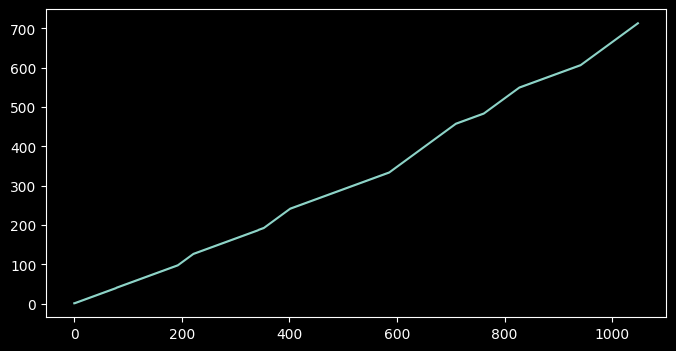

In [ ]:
# кривая детекций
df.frame_num.plot();

Анализ уверенности детекции

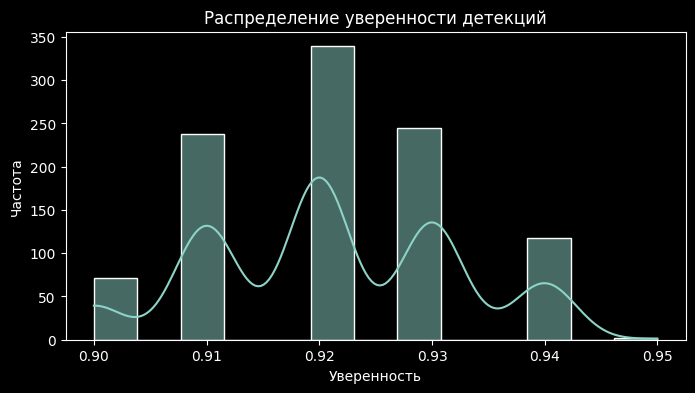

In [ ]:
# визуализация распределения уверенности
sns.histplot(df['face_conf'].dropna(), kde=True)
plt.title('Распределение уверенности детекций')
plt.xlabel('Уверенность')
plt.ylabel('Частота')
plt.show()

Распределение уверенности по классам пола

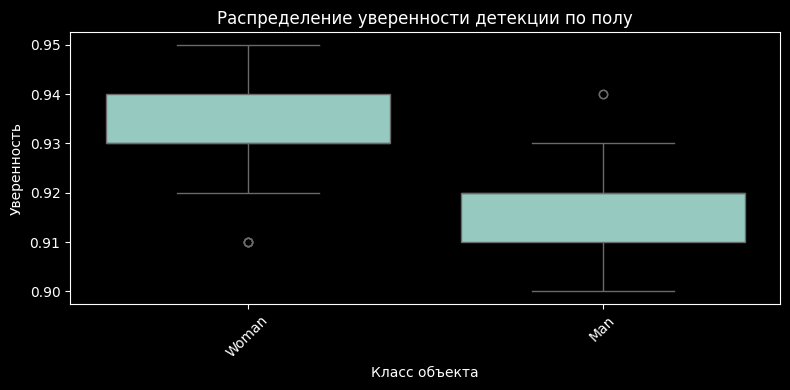

In [ ]:
# анализ уверенности по классам
sns.boxplot(x='gender', y='face_conf', data=df.dropna())
plt.title('Распределение уверенности детекции по полу')
plt.xlabel('Класс объекта')
plt.ylabel('Уверенность')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Распределение уверенности по классам эмоций

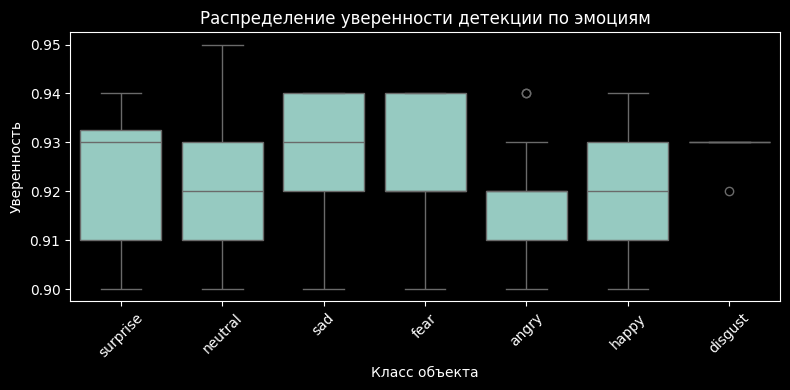

In [ ]:
# анализ уверенности по классам
sns.boxplot(x='emotion', y='face_conf', data=df.dropna())
plt.title('Распределение уверенности детекции по эмоциям')
plt.xlabel('Класс объекта')
plt.ylabel('Уверенность')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Анализ частоты обнаружения объектов

In [ ]:
total_frames = len(df)
frames_with_detections = df['face_conf'].notna().sum()
detection_rate = frames_with_detections / total_frames

print(f"Всего кадров: {total_frames}")
print(f"Кадров с обнаружениями: {frames_with_detections}")
print(f"Частота обнаружений: {detection_rate:.2%}")

Всего кадров: 1049
Кадров с обнаружениями: 1013
Частота обнаружений: 96.57%


Распределение частоты обнаружения по классам пола

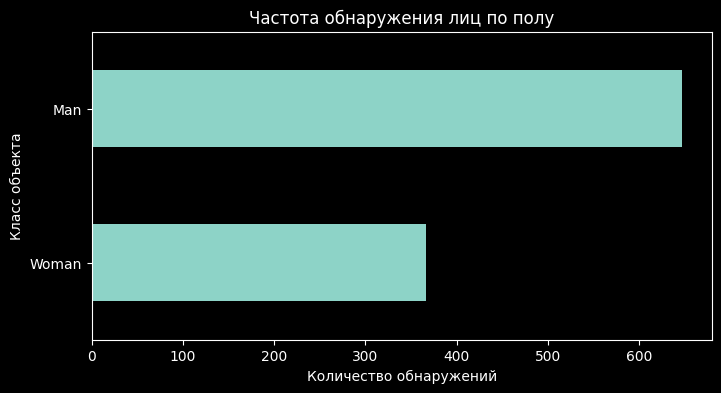

In [ ]:
# визуализация частоты обнаружения по классам пола
df['gender'].value_counts(ascending=True).plot(kind='barh')
plt.title('Частота обнаружения лиц по полу')
plt.xlabel('Количество обнаружений')
plt.ylabel('Класс объекта')
plt.show()

Распределение частоты обнаружения по классам эмоций

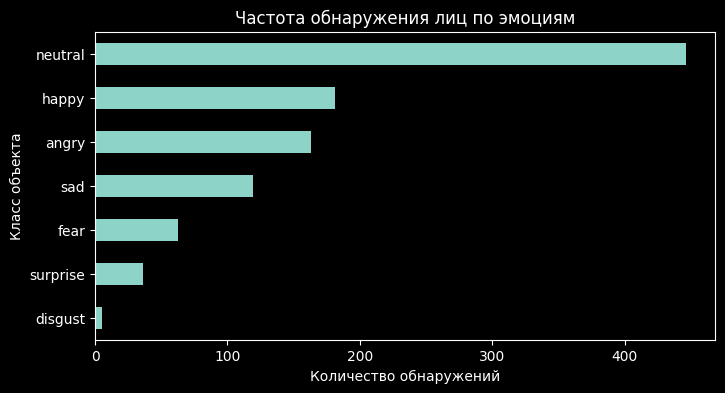

In [ ]:
# визуализация частоты обнаружения по классам эмоций
df['emotion'].value_counts(ascending=True).plot(kind='barh')
plt.title('Частота обнаружения лиц по эмоциям')
plt.xlabel('Количество обнаружений')
plt.ylabel('Класс объекта')
plt.show()

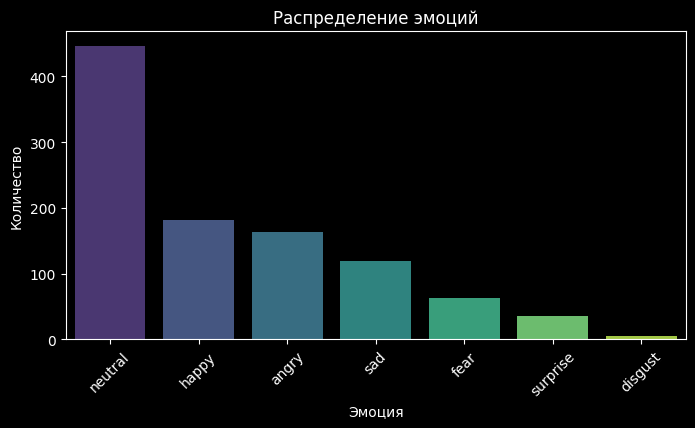

In [ ]:
df_clean = df.dropna(subset=['emotion'])
sns.countplot(data=df_clean, x='emotion', order=df_clean['emotion'].value_counts().index, palette='viridis')
plt.title('Распределение эмоций')
plt.xlabel('Эмоция')
plt.ylabel('Количество')
plt.xticks(rotation=45)
plt.show()

Распределение пола по эмоциям

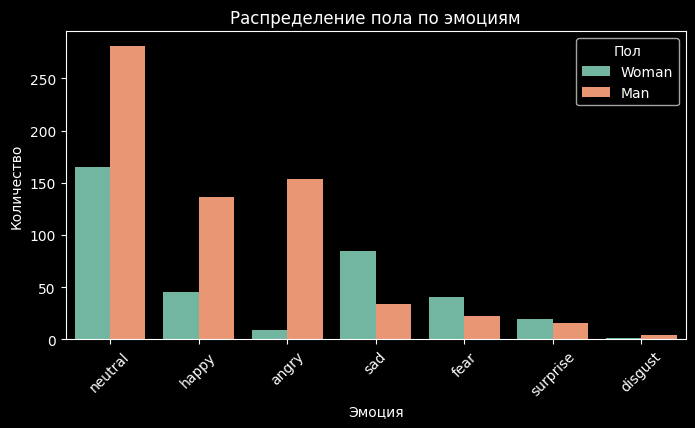

In [ ]:
# 4. Распределение пола и рас по эмоциям
sns.countplot(data=df_clean, x='emotion', hue='gender', palette='Set2', order=df_clean['emotion'].value_counts().index)
plt.title('Распределение пола по эмоциям')
plt.xlabel('Эмоция')
plt.ylabel('Количество')
plt.legend(title='Пол')
plt.xticks(rotation=45)
plt.show()

Распределение рас по эмоциям

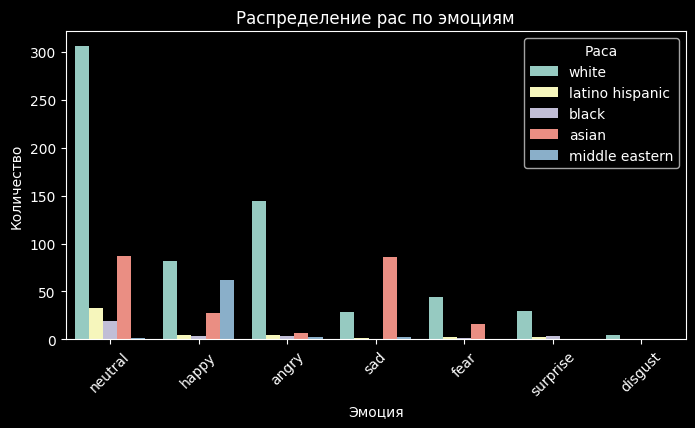

In [ ]:
sns.countplot(data=df_clean, x='emotion', hue='race', palette='Set3', order=df_clean['emotion'].value_counts().index)
plt.title('Распределение рас по эмоциям')
plt.xlabel('Эмоция')
plt.ylabel('Количество')
plt.legend(title='Раса')
plt.xticks(rotation=45)
plt.show()

Распределение частоты обнаружения по по возрасту

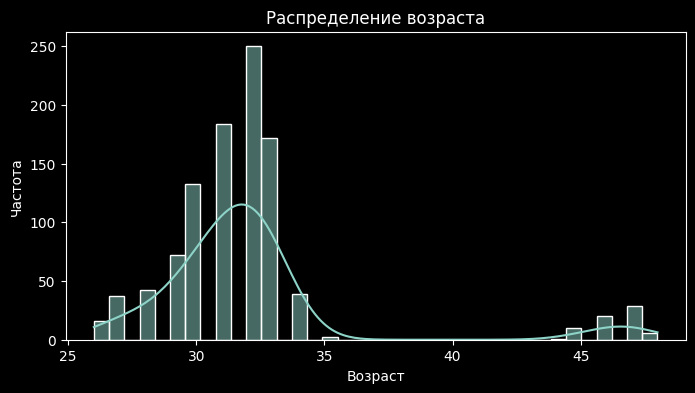

In [ ]:
df_clean = df.dropna(subset=['age'])
sns.histplot(df_clean['age'], kde=True)
plt.title('Распределение возраста')
plt.xlabel('Возраст')
plt.ylabel('Частота')
plt.show()

Кадры с наибольшим количеством детекций

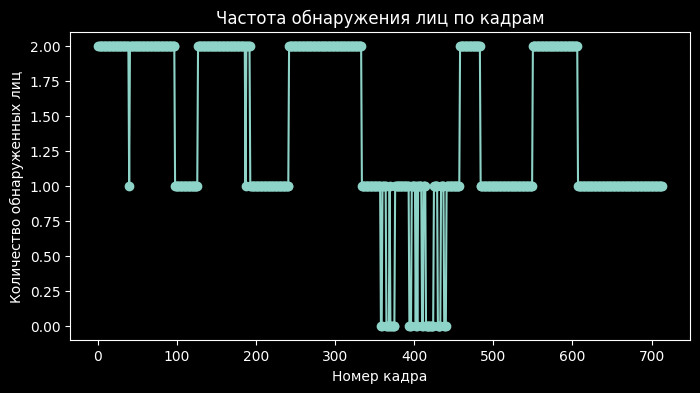

In [ ]:
face_count_per_frame = df.groupby('frame_num')['face_detected'].sum()
plt.plot(face_count_per_frame.index, face_count_per_frame.values, marker='o', linestyle='-')
plt.title('Частота обнаружения лиц по кадрам')
plt.xlabel('Номер кадра')
plt.ylabel('Количество обнаруженных лиц')
plt.show()

Секунды с наибольшим количеством детекций

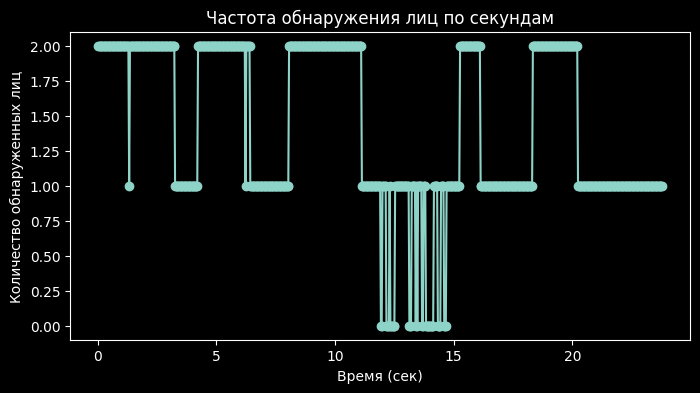

In [ ]:
face_count_per_frame = df.groupby('frame_sec')['face_detected'].sum()
plt.plot(face_count_per_frame.index, face_count_per_frame.values, marker='o', linestyle='-')
plt.title('Частота обнаружения лиц по секундам')
plt.xlabel('Время (сек)')
plt.ylabel('Количество обнаруженных лиц')
plt.show()

Какие классы в какое время были обнаружены (по полу)

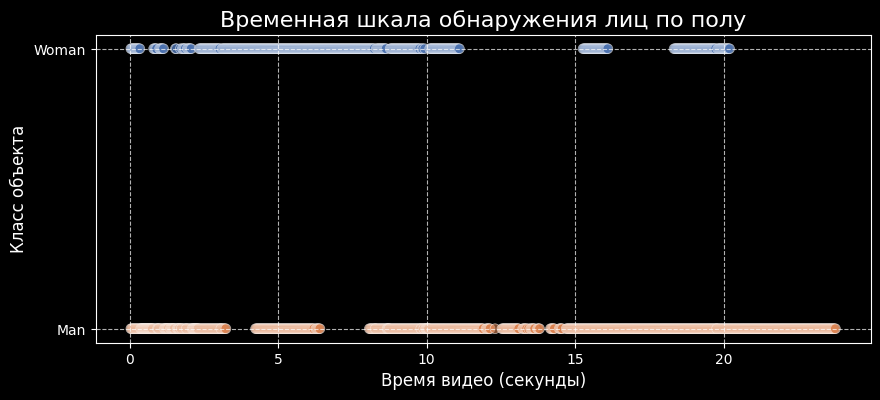

In [ ]:
# отсеить строки только с обнаружениями
detections = df.dropna(subset=['gender'])
plt.figure(figsize=(10, 4))
sns.scatterplot(data=detections, x='frame_sec', y='gender', hue='gender', palette='deep', s=50, alpha=0.6, legend=False)
plt.title('Временная шкала обнаружения лиц по полу', fontsize=16)
plt.xlabel('Время видео (секунды)', fontsize=12)
plt.ylabel('Класс объекта', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
# plt.legend(title='Классы объектов', title_fontsize='12', fontsize='10', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
plt.show()

Какие классы в какое время были обнаружены (по эмоциям)

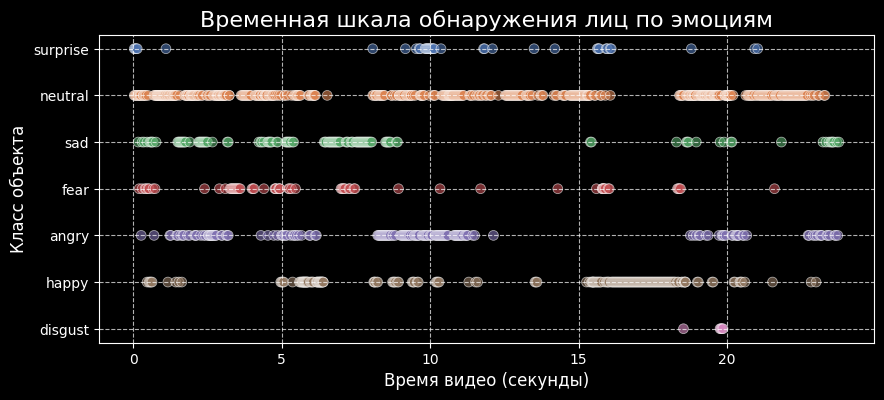

In [ ]:
# отсеить строки только с обнаружениями
detections = df.dropna(subset=['emotion'])
plt.figure(figsize=(10, 4))
sns.scatterplot(data=detections, x='frame_sec', y='emotion', hue='emotion', palette='deep', s=50, alpha=0.6, legend=False)
plt.title('Временная шкала обнаружения лиц по эмоциям', fontsize=16)
plt.xlabel('Время видео (секунды)', fontsize=12)
plt.ylabel('Класс объекта', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
# plt.legend(title='Классы объектов', title_fontsize='12', fontsize='10', bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
plt.show()

Распределение смены эмоций по времени и кол-ву детекций

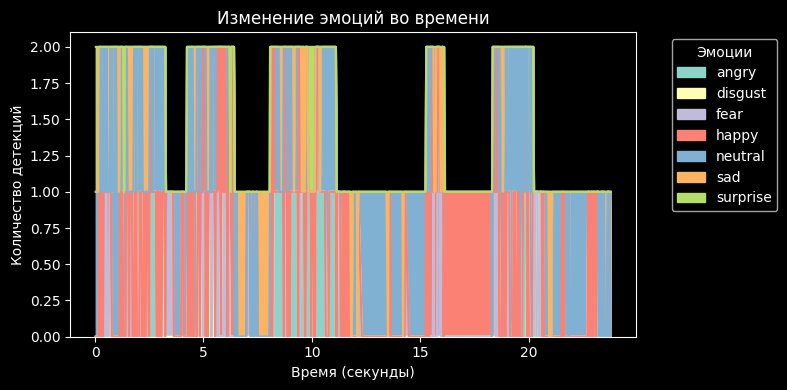

In [ ]:
emotion_timeline = df.pivot_table(index='frame_sec', columns='emotion', aggfunc='size', fill_value=0)
emotion_timeline.plot(kind='area', stacked=True)
plt.title('Изменение эмоций во времени')
plt.xlabel('Время (секунды)')
plt.ylabel('Количество детекций')
plt.legend(title='Эмоции', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## Все графики для Streamlit в одной ячейке

Импорты

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use('dark_background')

# параметры отрисовки для Colab
plt.rcParams.update({'figure.figsize': (8, 3)})
plt.rcParams.update({'font.size': 10})

# параметры отрисовки для Streamlit
# plt.style.use('dark_background')
# plt.rcParams.update({'figure.figsize': (7, 1.5)})
# plt.rcParams.update({'font.size': 5})

Чтение датасета

In [ ]:
df = pd.read_csv('video_annotations.csv')
df_clean = df.dropna(subset=['face_conf'])

In [ ]:
df.head(3)

,frame_num,frame_sec,face_conf,gender,gender_conf,age,race,race_conf,emotion,emotion_conf,x,y,w,h,face_detected
0,1,0.033333,0.93,Woman,97.301549,31.0,white,73.091745,surprise,72.616976,38.0,288.0,147.0,176.0,1
1,1,0.033333,0.90,Man,99.979919,32.0,white,36.021580,neutral,99.974614,214.0,315.0,150.0,187.0,1
2,2,0.066667,0.93,Woman,97.375238,31.0,white,72.946638,surprise,72.809264,38.0,288.0,147.0,176.0,1


Отрисовка графиков (в Streamlit раскомментировать строки `st.write` и `st.pyplot`)

'---'

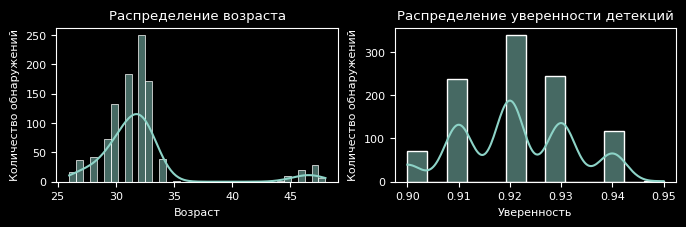

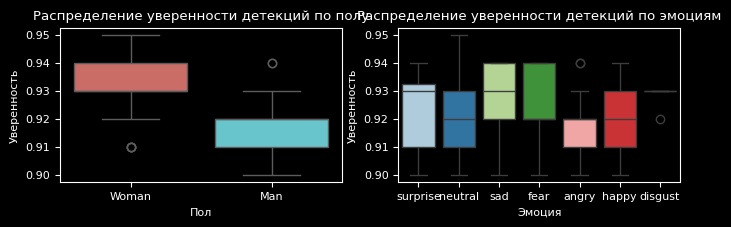

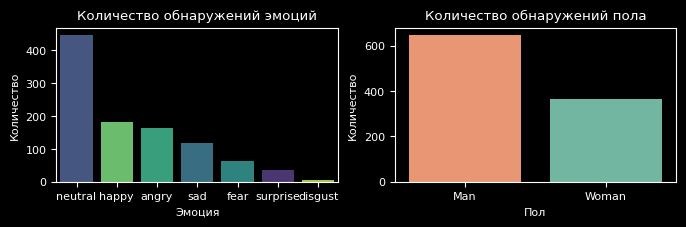

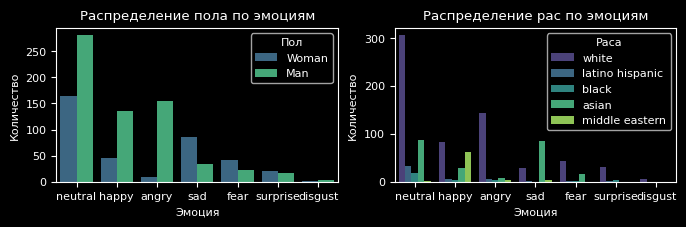

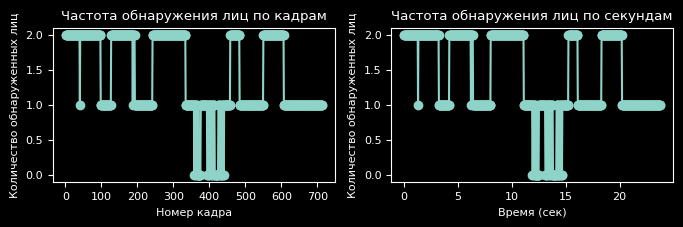

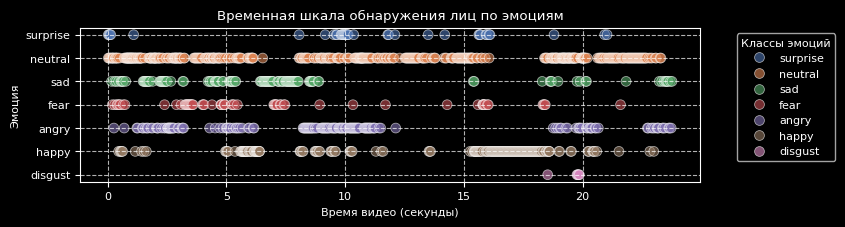

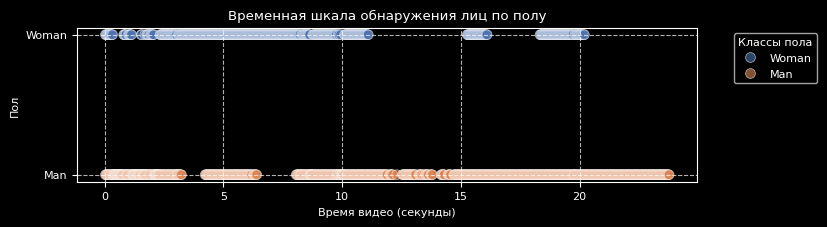

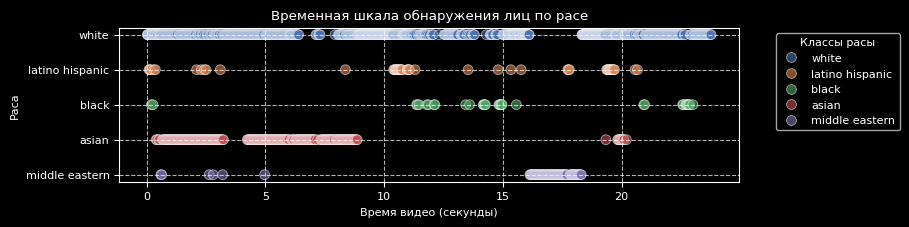

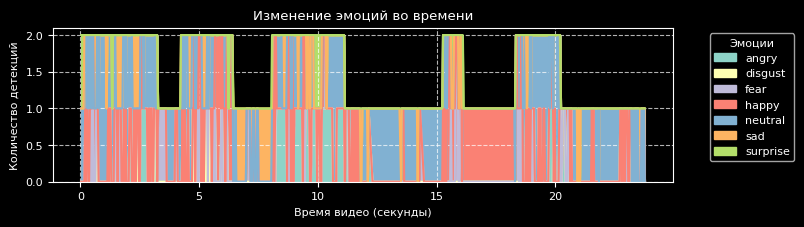

In [ ]:
# st.write('---')
# st.write('Количество детекций по возрасту и по уверенности модели')

fig, axes = plt.subplots(1, 2)

sns.histplot(df_clean['age'], kde=True, ax=axes[0])
axes[0].set_title('Распределение возраста')
axes[0].set_xlabel('Возраст')
axes[0].set_ylabel('Количество обнаружений')

sns.histplot(df_clean['face_conf'], kde=True, ax=axes[1])
axes[1].set_title('Распределение уверенности детекций')
axes[1].set_xlabel('Уверенность')
axes[1].set_ylabel('Количество обнаружений')


# st.pyplot(fig, use_container_width=False)
# st.write('---')
# st.write('Распределение уверенности модели по классам пола и эмоций')


fig, axes = plt.subplots(1, 2)

sns.boxplot(
    data=df_clean,
    x='gender',
    y='face_conf',
    hue='gender',
    palette='hls',
    ax=axes[0],
    )
axes[0].set_title('Распределение уверенности детекций по полу')
axes[0].set_xlabel('Пол')
axes[0].set_ylabel('Уверенность')
# axes[0].tick_params(axis='x', labelrotation=45)

sns.boxplot(
    data=df_clean,
    x='emotion',
    y='face_conf',
    hue='emotion',
    palette='hls',
    ax=axes[1],
    )
sns.boxplot(x='emotion', y='face_conf', data=df_clean, ax=axes[1], palette='Paired')
axes[1].set_title('Распределение уверенности детекций по эмоциям')
axes[1].set_xlabel('Эмоция')
axes[1].set_ylabel('Уверенность')


# st.pyplot(fig, use_container_width=False)
# st.write('---')
# st.write('Количество детекций по классам эмоций и пола')


fig, axes = plt.subplots(1, 2)

sns.countplot(
    data=df_clean,
    x='emotion',
    hue='emotion',
    order=df_clean['emotion'].value_counts().index,
    palette='viridis',
    legend=False,
    ax=axes[0],
    )
axes[0].set_title('Количество обнаружений эмоций')
axes[0].set_xlabel('Эмоция')
axes[0].set_ylabel('Количество')

sns.countplot(
    data=df_clean,
    x='gender',
    hue='gender',
    order=df_clean['gender'].value_counts().index,
    palette='Set2',
    legend=False,
    ax=axes[1],
    )
axes[1].set_title('Количество обнаружений пола')
axes[1].set_xlabel('Пол')
axes[1].set_ylabel('Количество')


# st.pyplot(fig, use_container_width=False)
# st.write('---')
# st.write('Количество детекций по классу эмоций в зависимости от пола и расы')


fig, axes = plt.subplots(1, 2)

sns.countplot(
    data=df_clean,
    x='emotion',
    hue='gender',
    palette='viridis',
    order=df_clean['emotion'].value_counts().index,
    ax=axes[0],
    )
axes[0].set_title('Распределение пола по эмоциям')
axes[0].set_xlabel('Эмоция')
axes[0].set_ylabel('Количество')
axes[0].legend(title='Пол')

sns.countplot(
    data=df_clean,
    x='emotion',
    hue='race',
    palette='viridis',
    order=df_clean['emotion'].value_counts().index,
    ax=axes[1],
    )
axes[1].set_title('Распределение рас по эмоциям')
axes[1].set_xlabel('Эмоция')
axes[1].set_ylabel('Количество')
axes[1].legend(title='Раса')


# st.pyplot(fig, use_container_width=False)
# st.write('---')
# st.write('Кадры и секунды с наибольшим количеством детекций')


fig, axes = plt.subplots(1, 2)

face_count_per_frame = df.groupby('frame_num')['face_detected'].sum()
axes[0].plot(face_count_per_frame.index, face_count_per_frame.values, marker='o', linestyle='-')
axes[0].set_title('Частота обнаружения лиц по кадрам')
axes[0].set_xlabel('Номер кадра')
axes[0].set_ylabel('Количество обнаруженных лиц')

face_count_per_frame = df.groupby('frame_sec')['face_detected'].sum()
axes[1].plot(face_count_per_frame.index, face_count_per_frame.values, marker='o', linestyle='-')
axes[1].set_title('Частота обнаружения лиц по секундам')
axes[1].set_xlabel('Время (сек)')
axes[1].set_ylabel('Количество обнаруженных лиц')


# st.pyplot(fig, use_container_width=False)
# st.write('---')
# st.write('Какие классы в какое время были обнаружены (по эмоциям)')


fig, ax = plt.subplots(1, 1)

sns.scatterplot(
    data=df_clean,
    x='frame_sec',
    y='emotion',
    hue='emotion',
    palette='deep',
    s=50,
    alpha=0.6,
    legend=True,
    ax=ax,
    )
ax.set_title('Временная шкала обнаружения лиц по эмоциям')
ax.set_xlabel('Время видео (секунды)')
ax.set_ylabel('Эмоция')
ax.grid(True, linestyle='--', alpha=0.7)
ax.legend(title='Классы эмоций', bbox_to_anchor=(1.05, 1), loc='upper left')


# st.pyplot(fig, use_container_width=False)
# st.write('---')
# st.write('Какие классы в какое время были обнаружены (по полу)')


fig, ax = plt.subplots()

sns.scatterplot(
    data=df_clean,
    x='frame_sec',
    y='gender',
    hue='gender',
    palette='deep',
    s=50,
    alpha=0.6,
    legend=True,
    ax=ax,
    )
ax.set_title('Временная шкала обнаружения лиц по полу')
ax.set_xlabel('Время видео (секунды)')
ax.set_ylabel('Пол')
ax.grid(True, linestyle='--', alpha=0.7)
ax.legend(title='Классы пола', bbox_to_anchor=(1.05, 1), loc='upper left')


st.pyplot(fig, use_container_width=False)
st.write('---')
st.write('Какие классы в какое время были обнаружены (по расе)')


fig, ax = plt.subplots()

sns.scatterplot(
    data=df_clean,
    x='frame_sec',
    y='race',
    hue='race',
    palette='deep',
    s=50,
    alpha=0.6,
    legend=True,
    ax=ax,
    )
ax.set_title('Временная шкала обнаружения лиц по расе')
ax.set_xlabel('Время видео (секунды)')
ax.set_ylabel('Раса')
ax.grid(True, linestyle='--', alpha=0.7)
ax.legend(title='Классы расы', bbox_to_anchor=(1.05, 1), loc='upper left')


# st.pyplot(fig, use_container_width=False)
# st.write('---')
# st.write('Распределение смены эмоций по времени и кол-ву детекций')


fig, ax = plt.subplots()

emotion_timeline = df.pivot_table(
    index='frame_sec',
    columns='emotion',
    aggfunc='size',
    fill_value=0,
    )
emotion_timeline.plot(kind='area', stacked=True, ax=ax)
ax.set_title('Изменение эмоций во времени')
ax.set_xlabel('Время видео (секунды)')
ax.set_ylabel('Количество детекций')
ax.grid(True, linestyle='--', alpha=0.7)
ax.legend(title='Эмоции', bbox_to_anchor=(1.05, 1), loc='upper left')


# st.pyplot(fig, use_container_width=False)
# st.write('---')

# Структура приложения Streamlit

**Streamlit основные ссылки**

---
Доки  
https://docs.streamlit.io/library/get-started  
Streamlit discuss  
https://discuss.streamlit.io/  
Быстрая шпаргалка   
https://docs.streamlit.io/library/cheatsheet

Галерея приложений + блог + компоненты интерфейса  
https://streamlit.io/gallery?category=favorites  
https://blog.streamlit.io/  
https://streamlit.io/components

Руководства по деплою Streamlit приложений на Hugging Face  
https://huggingface.co/blog/streamlit-spaces  
https://huggingface.co/docs/hub/spaces-sdks-streamlit  


**Streamlit доп ссылки**  

---
Развертывание Streamlit приложения в облаке Streamlit через GitHub (видео инструкция)  
https://www.youtube.com/watch?v=xly4dMtAxZE&list=PLtPJ9lKvJ4og1zvH9MzNvr3X4Zwd2gsiN&index=3  
Stepik один урок по Streamlit  
https://stepik.org/lesson/1009061/step/5?unit=1016868  

Приложение Титаник  
https://titanic.streamlit.app/  
https://github.com/evgpat/streamlit_demo  

Чат бот Open AI  
https://github.com/streamlit/llm-examples  

Туториалы статьи  
https://habr.com/ru/articles/473196/  
https://habr.com/ru/companies/otus/articles/701412/  
https://proglib.io/p/sozdanie-interaktivnyh-paneley-s-streamlit-i-python-2021-06-21  
https://www.geeksforgeeks.org/a-beginners-guide-to-streamlit/  
https://www.machinelearningnuggets.com/streamlit-tutorial/  

---


**Структура проекта**

- 📁 `media`
- - `emotions_detect.png`
- - `result_video.mp4`

- 📁 `fonts`
- - `LiberationMono-Regular.ttf`

- 📁 `models`

- 📁 `pages`
- - `1_Video_Detection.py`
- - `2_Video_Detection_Results.py`
- - `3_Web_Camera_Photo.py`

- `Image_Detection.py`
- `draw_utils.py`
- `detector.py`
- `requirements.txt`

Код файлов проекта в репозитории  
https://github.com/sergey21000/face-detector-deepface

---

**Содержимое `requirements.txt` для установки с поддержкой CUDA**
```
--extra-index-url https://pypi.nvidia.com
tensorflow[and-cuda]==2.15
tf-keras==2.15
deepface==0.0.93
streamlit==1.39.0
python-ffmpeg==2.0.12
seaborn==0.13.2
```


**Содержимое `requirements-cpu.txt` для установки с поддержкой CPU**
```
tensorflow==2.15
tf-keras==2.15
deepface==0.0.93
streamlit==1.39.0
python-ffmpeg==2.0.12
seaborn==0.13.2
```


---

**Установка и запуск на Linux с поддержкой CPU и CUDA**

1) Создание и активация виртуального окружения (опционально)

```
python3 -m venv env
source env/bin/activate
```

2) Установка библиотек
 - *С поддержкой CPU*
```
pip install -r requirements-cpu.txt
```

 - *С поддержкой CUDA*
```
pip install -r requirements.txt
```

3) Запуск приложения

```
streamlit run Image_Detection.py
```
Перейти в браузере http://localhost:8501/  

[Документация](https://www.tensorflow.org/install/pip) с командами установки TensorFlow для Windows

---
**Запуск приложения**
```
streamlit run Detect_images.py
```

Если не хватает видео памяти, то добавить перед импортом `deepface`
```python
import os
import tensorflow as tf

os.environ['TF_GPU_ALLOCATOR'] = 'cuda_malloc_async'
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as ex:
        print(ex)

from deepface import DeepFace
```
Документация по использованию GPU в TemsorFlow  
https://www.tensorflow.org/guide/gpu?hl=en#limiting_gpu_memory_growth

# Docker

Документация TensorFlow по Docker  
https://www.tensorflow.org/install/docker?hl=ru

Образы TensorFlow на Docker Hub  
https://hub.docker.com/r/tensorflow/tensorflow/

---

**Сборка образа и запуск контейнера:**

1) Сборка образа  с поддержкой CPU и CUDA

```
docker build -t face-detector -f Dockerfile .
```

2) Запуск контейнера на 8501 порту с пробросом папок через `docker volumes`
 - с поддержкой CPU
```
docker run -it -p 8501:8501 -v ./models:/app/models --name face-detector face-detector
```

 - с поддержкой CUDA
```
docker run -it --gpus all -p 8501:8501 -v ./models:/app/models --name face-detector face-detector
```

Открыть в браузере адрес http://localhost:8501/  

---

**Содержимое `Dockerfile`**
```
FROM tensorflow/tensorflow:2.15.0-gpu
RUN apt-get update && apt-get install -y ffmpeg
WORKDIR /app
COPY requirements.txt .
RUN pip install --no-cache-dir --ignore-installed blinker==1.8.2
RUN pip install --no-cache-dir $(grep -ivE "tensorflow|tf-keras|--extra-index-url" requirements.txt)
COPY media/ ./media/
COPY fonts/ ./fonts/
COPY pages/ ./pages/
COPY detector.py Image_Detection.py draw_utils.py .
EXPOSE 8501
CMD ["streamlit", "run", "Image_Detection.py", "--server.port=8501", "--server.address=0.0.0.0"]

```

Несжатый образ весит 8.08 GB